<a href="https://colab.research.google.com/github/muratgguzel/AIML-DeepLearnig-Introduction-Neural-Networks/blob/main/LeadGenAIEnginee.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EPAM Lead Generator AI/ML Engine


### Background and Context





### Objective



## 1-LOADING LIBRARIES

In [ ]:
# this will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black

import warnings

warnings.filterwarnings("ignore")

# Libraries to help with reading and manipulating data

import pandas as pd
import numpy as np

# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# Library to split data
from sklearn.model_selection import train_test_split

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To build model for prediction

from sklearn.linear_model import LogisticRegression

# To get diferent metric scores

from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay as plot_confusion_matrix,
    precision_recall_curve,
    roc_curve,
    make_scorer,
)
# To impute missing values
from sklearn.impute import KNNImputer

# To oversample and undersample data
#from imblearn.over_sampling import SMOTE
#from imblearn.under_sampling import RandomUnderSampler

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
#To install xgboost library use - !pip install xgboost 
from xgboost import XGBClassifier


##2-LOADING AND EXPLORING DATA

- Loading Data Form CSV

In [ ]:
Row_Data = pd.read_csv("c:/Code/Epam_Repo/leadgenaiengine/BankChurners.csv")

- Copying row data for working

In [ ]:
# copying data to another variable to avoid any changes to original data
data = Row_Data.copy()

 View the first and last 5 rows of the dataset.

In [ ]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
print(f"There are {data.shape[0]} rows and {data.shape[1]} columns.")  

There are 10127 rows and 21 columns.


The dataset has 10127 rows and 21 columns 

 - Check data format

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

Data set consist of integer,float and object types

- Check any Null data exits

In [ ]:
data.isnull().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [ ]:
data.isnull().values.any()

True

Missing Values counts  per Row 

In [ ]:
num_missing = data.isnull().sum(axis=1)
num_missing.value_counts()

0    7973
1    2040
2     114
dtype: int64

In [ ]:
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CLIENTNUM                    0.0
Attrition_Flag               0.0
Customer_Age                 0.0
Gender                       0.0
Dependent_count              0.0
Education_Level             15.0
Marital_Status               7.4
Income_Category              0.0
Card_Category                0.0
Months_on_book               0.0
Total_Relationship_Count     0.0
Months_Inactive_12_mon       0.0
Contacts_Count_12_mon        0.0
Credit_Limit                 0.0
Total_Revolving_Bal          0.0
Avg_Open_To_Buy              0.0
Total_Amt_Chng_Q4_Q1         0.0
Total_Trans_Amt              0.0
Total_Trans_Ct               0.0
Total_Ct_Chng_Q4_Q1          0.0
Avg_Utilization_Ratio        0.0
dtype: float64

%15 of Education Level Data and 7.4 Marital Staus is null

Check for Dublicated Data

In [ ]:
data[data.duplicated()].count()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,NaN,NaN,NaN,739177606.333663,36903783.450231,708082083.0,713036770.5,717926358.0,773143533.0,828343083.0
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.0,NaN,NaN,NaN,46.32596,8.016814,26.0,41.0,46.0,52.0,73.0
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.0,NaN,NaN,NaN,2.346203,1.298908,0.0,1.0,2.0,3.0,5.0
Education_Level,8608,6,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,9378,3,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.0,NaN,NaN,NaN,35.928409,7.986416,13.0,31.0,36.0,40.0,56.0


**2.1** **Observations About Data**

The dataset has `10127` rows and `21` columns exits

`Education_Level`: `%15` of data is missing 

`Marital_Status`: `%7` of data is missing

`Dublicated Data`: `No Dublicated` Data exits






**2.2** **Statistical Observations**

`Age`: %75 Percent of customers are less than 52 years old

`Mounths On Book`: %50 of customers have 36 Mounths or less relationship with bank

`Total Relationship Count`: %50 of customers have 4 or less product relationship with the bank

`Mounths Inactive in 12 Mounth`: %50 of customers 2 (or less) mounths inactive in last 12 mounths

`Contacts Count in 12 Mounth`: %50 of customers 2 (or less) mounth contact with the bank in last 12 mounths

`Credit Limit`: %50 of Customers have limit 4549 (or less) credit card limit

`Total_Revolving_Bal`: %50 of customers 1276 (or less) Revolving Balance 

`Avg_Open_To_Buy`:%50 of customers have 3474 (or less) balance amount left on the card to use

`Total Transaction Amount (Last 12 Mounths)`: %50 of customers has made 3899.0 or less transaction amount in last 12 mounths

`Total Transaction Count (Last 12 Mounths)`: %50 of customers has made 67 or less transaction count in last 12 mounths

`Total_Ct_Chng_Q4_Q1`: %75 of cutomers have a ratio of 0.818 (or less) 

`Total_Amt_Chng_Q4_Q1`: %75 of cutomers have a ratio of 0.859 (or less) 

In [ ]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


Print data values generalization behaviour

In [ ]:
print(data.Attrition_Flag.value_counts())
print(data.Customer_Age.value_counts())
print(data.Gender.value_counts())
print(data.Dependent_count	.value_counts())
print(data.Education_Level.value_counts())
print(data.Marital_Status.value_counts())
print(data.Income_Category.value_counts())
print(data.Card_Category.value_counts())
print(data.Months_on_book.value_counts())
print(data.Total_Relationship_Count.value_counts())
print(data.Months_Inactive_12_mon.value_counts())
print(data.Contacts_Count_12_mon.value_counts())
print(data.Credit_Limit.value_counts())
print(data.Total_Revolving_Bal.value_counts())
print(data.Avg_Open_To_Buy.value_counts())
print(data.Total_Amt_Chng_Q4_Q1.value_counts())
print(data.Total_Trans_Amt.value_counts())
print(data.Total_Trans_Ct.value_counts())
print(data.Total_Ct_Chng_Q4_Q1.value_counts())
print(data.Avg_Utilization_Ratio.value_counts())







Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
44    500
49    495
46    490
45    486
47    479
43    473
48    472
50    452
42    426
51    398
53    387
41    379
52    376
40    361
39    333
54    307
38    303
55    279
56    262
37    260
57    223
36    221
35    184
59    157
58    157
34    146
33    127
60    127
32    106
65    101
61     93
62     93
31     91
26     78
30     70
63     65
29     56
64     43
27     32
28     29
67      4
66      2
68      2
70      1
73      1
Name: Customer_Age, dtype: int64
F    5358
M    4769
Name: Gender, dtype: int64
3    2732
2    2655
1    1838
4    1574
0     904
5     424
Name: Dependent_count, dtype: int64
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64
Less than $40K    3561
$40K - $60

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

##3-EXPLOTARY DATA ANALYSIS

Define Categorical Columns vrs Numerical Columns for EDA Analyzes

In [ ]:

categorical_cols = ["Attrition_Flag","Gender", "Education_Level","Marital_Status","Income_Category","Card_Category"]

numerical_cols = [
    "Customer_Age",
    "Dependent_count",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio"
]

- For EDA analyzes data_EDA dataframe is forming

In [ ]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
data_EDA=data.copy()

**3.1** **UNIVARITY ANALYZES**

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data:    dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

**3.1.1** **CHECKING AGE**

In [ ]:
data_EDA.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


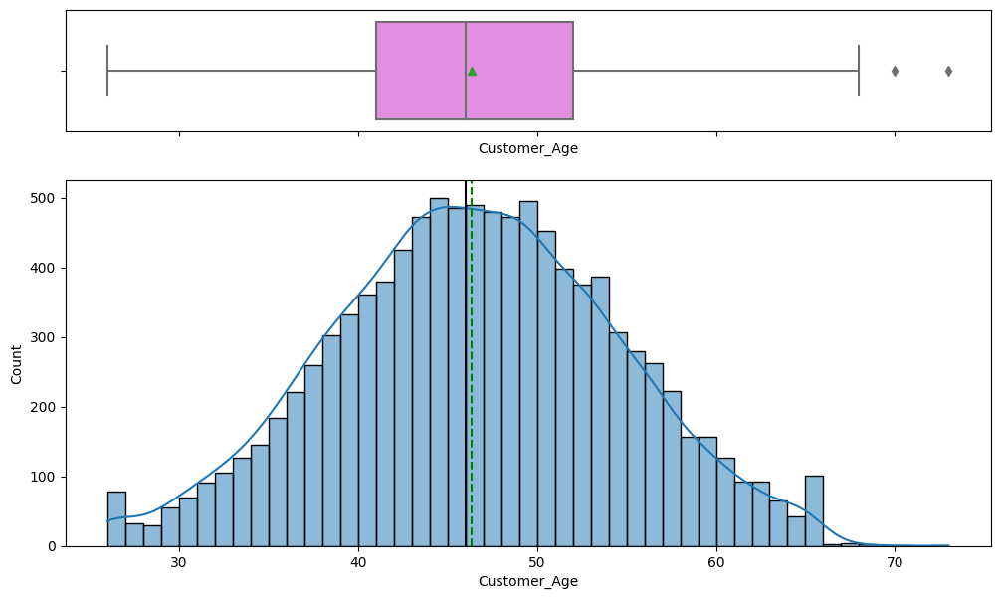

In [ ]:
histogram_boxplot(data_EDA,"Customer_Age",kde=True)

In [ ]:
data_EDA["Customer_Age"].median()


46.0

In [ ]:
data_EDA["Customer_Age"].mean()

46.32596030413745

- AGE Median and Mean value is so close and showing no outliers which is showing a normal distribution

**3.1.2** **CHECKING MOUNTHS ON BOOK**

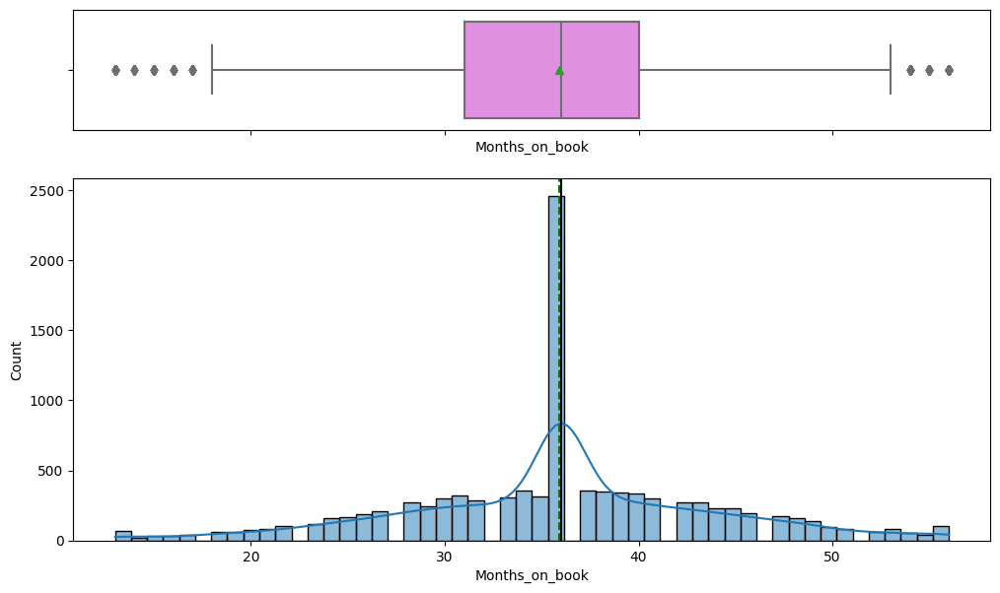

In [ ]:
histogram_boxplot(data_EDA,"Months_on_book",kde=True)

In [ ]:
data_EDA["Months_on_book"].mean()

35.928409203120374

In [ ]:
data_EDA["Months_on_book"].median()

36.0

Mounths On Book  is is nearly showing normal distribution having Mean:35.9 and Median:36.0 with having outliers

**3.1.3** **CHECKING TOTAL RELATIONSHIP COUNT**

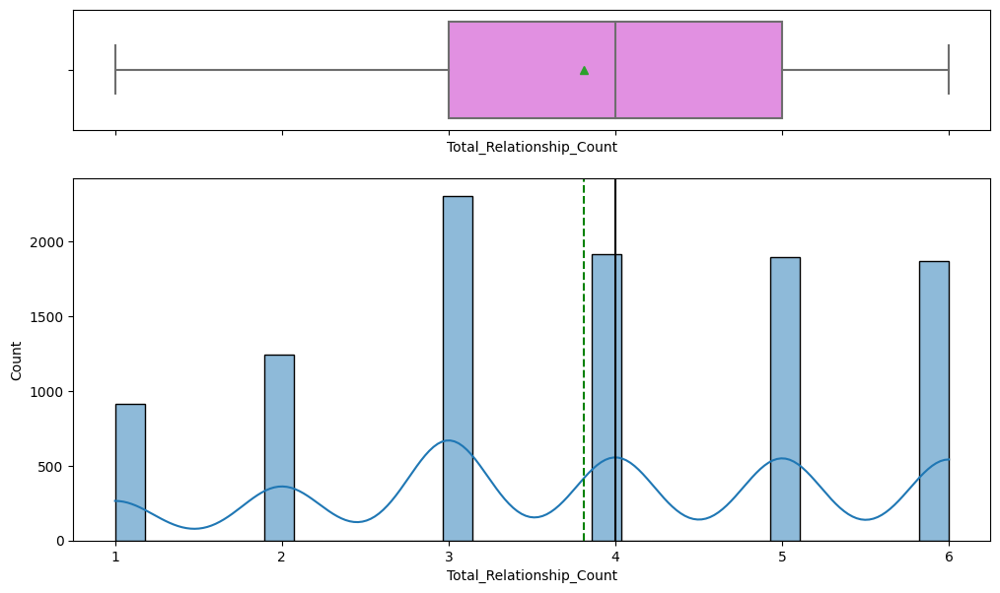

In [ ]:
histogram_boxplot(data_EDA,"Total_Relationship_Count",kde=True)

In [ ]:
data_EDA["Total_Relationship_Count"].mean()

3.8125802310654686

In [ ]:
data_EDA["Total_Relationship_Count"].median()

4.0

Median=4 and Mean=3.8 are close to each other nearly 4 products held by customers 

**3.1.4** **CHECKING Months Inactive In 12 Mounths**

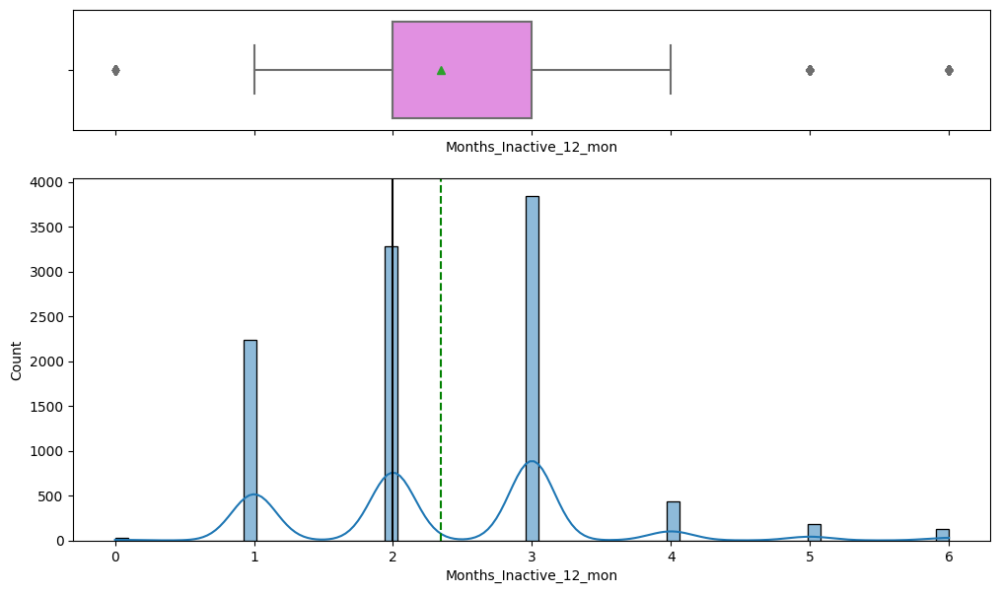

In [ ]:
histogram_boxplot(data_EDA,"Months_Inactive_12_mon",kde=True)

In [ ]:
data_EDA["Months_Inactive_12_mon"].mean()

2.3411671768539546

In [ ]:
data_EDA["Months_Inactive_12_mon"].median()

2.0

Mean=2.3 and Median=2.0 of InActive Mounths in 12 Mounth range is close and 2 Mounths.

In [ ]:
data_EDA.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


**3.1.5** **CHECKING Contacts Count In 12 Mounths**

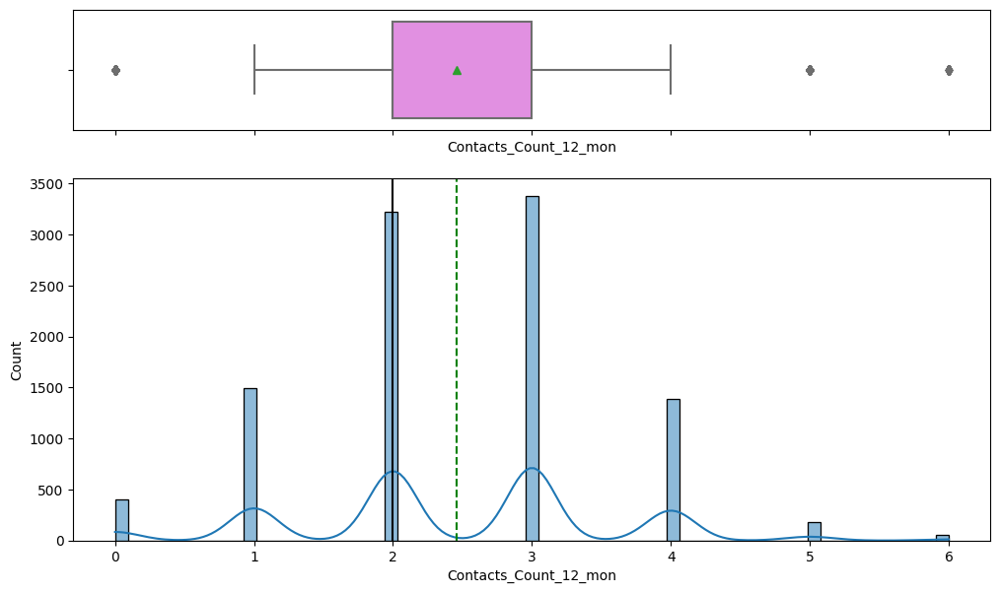

In [ ]:
histogram_boxplot(data_EDA,"Contacts_Count_12_mon",kde=True)

In [ ]:
data_EDA["Contacts_Count_12_mon"].mean()

2.4553174681544387

In [ ]:
data_EDA["Contacts_Count_12_mon"].median()

2.0

Contacts count in 12 Mounths with the customer average is 2 with having outliers

**3.1.6** **CHECKING Credit_Limit**

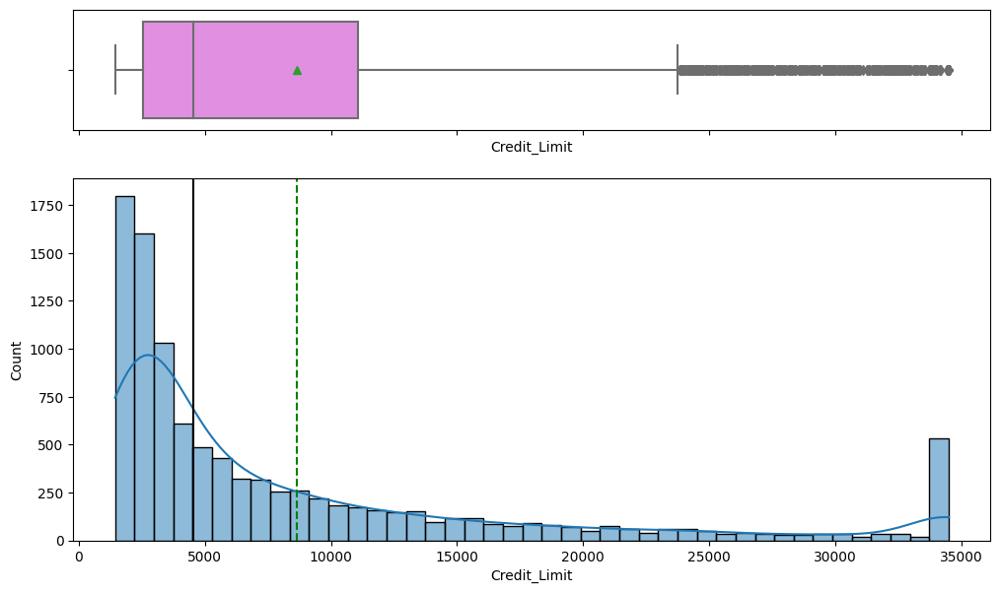

In [ ]:
histogram_boxplot(data_EDA,"Credit_Limit",kde=True)

In [ ]:
data_EDA["Credit_Limit"].mean()

8631.953698034955

In [ ]:
data_EDA["Credit_Limit"].median()

4549.0

Credit limit of customer Right Skewed having Mean of 8631 and Median=4549 . Credit limit also have outliers

**3.1.7** **CHECKING Total Revolving Balance**

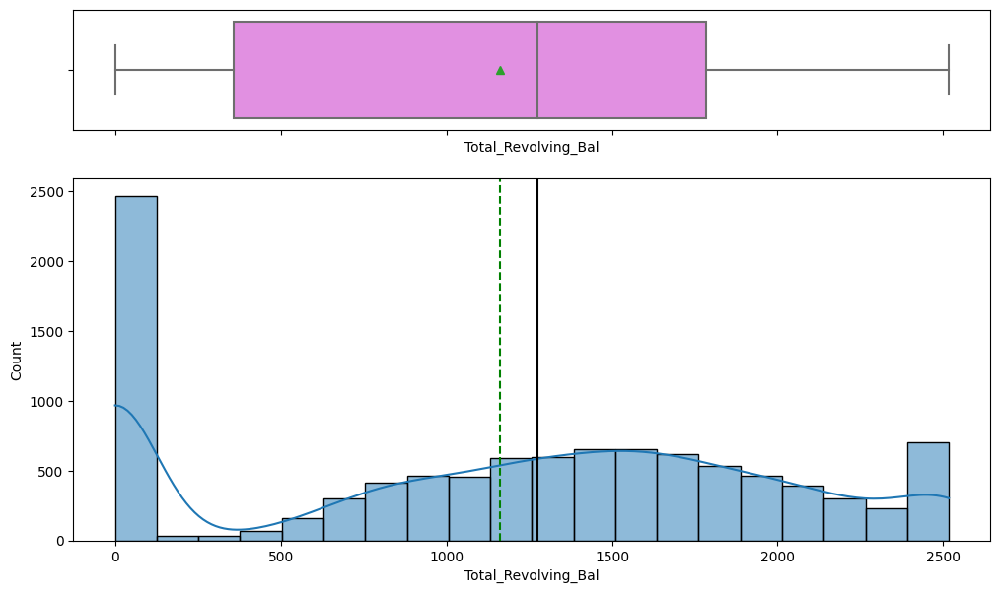

In [ ]:
histogram_boxplot(data_EDA,"Total_Revolving_Bal",kde=True)

In [ ]:
data_EDA["Total_Revolving_Bal"].mean()

1162.8140614199665

In [ ]:
data_EDA["Total_Revolving_Bal"].median()

1276.0

Revolving balance Median and Mean is close to each other . Nearly normal distribution pattern shows.

**3.1.8** **CHECKING Avg_Open_To_Buy**

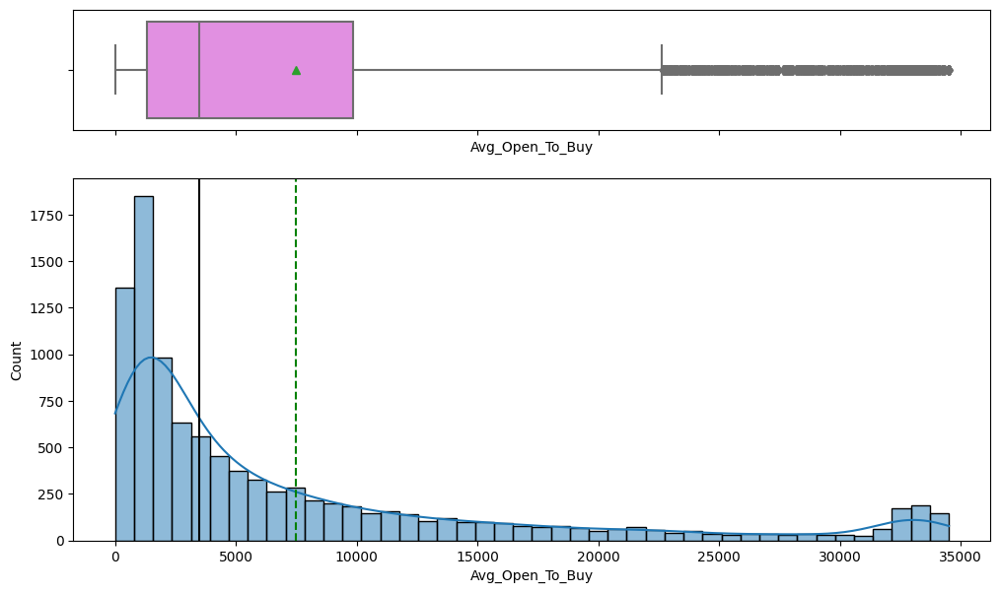

In [ ]:
histogram_boxplot(data_EDA,"Avg_Open_To_Buy",kde=True)

In [ ]:
data_EDA["Avg_Open_To_Buy"].mean()

7469.139636614989

In [ ]:
data_EDA["Avg_Open_To_Buy"].median()

3474.0

Avg(12 Mounths) Open To Buy Right skews with having Outliers. Mean = 7469 and Median=3474

**3.1.9** **CHECKING Total_Amt_Chng_Q4_Q1**

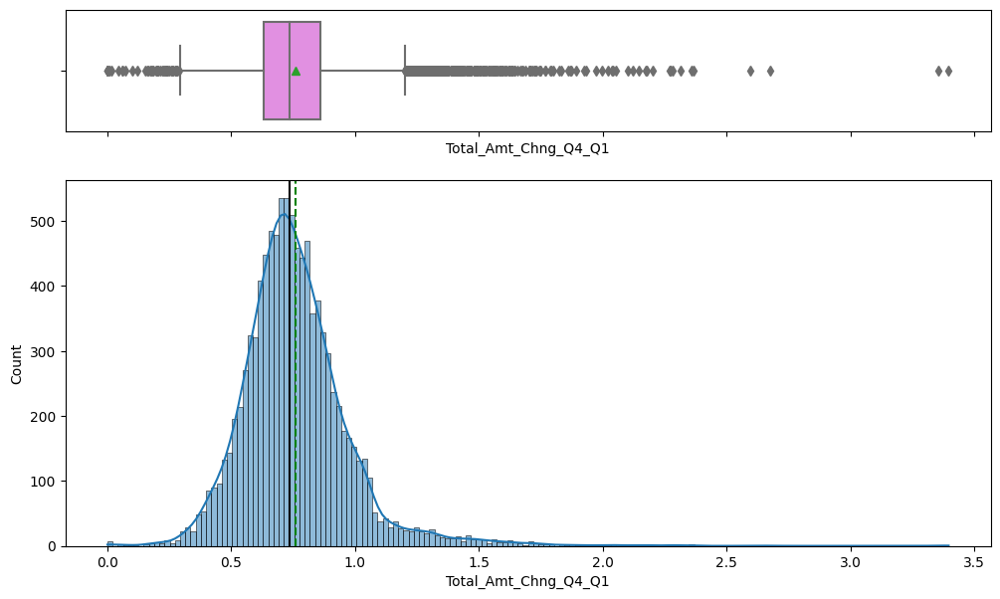

In [ ]:
histogram_boxplot(data_EDA,"Total_Amt_Chng_Q4_Q1",kde=True)

In [ ]:
data_EDA["Total_Amt_Chng_Q4_Q1"].mean()

0.7599406536980349

In [ ]:
data_EDA["Total_Amt_Chng_Q4_Q1"].median()

0.736

Total_Amt_Chng_Q4_Q1 shows normal distribution with having Outliers. Mean=0.75 and Median=0.73

**3.1.10** **CHECKING Total_Trans_Amt**

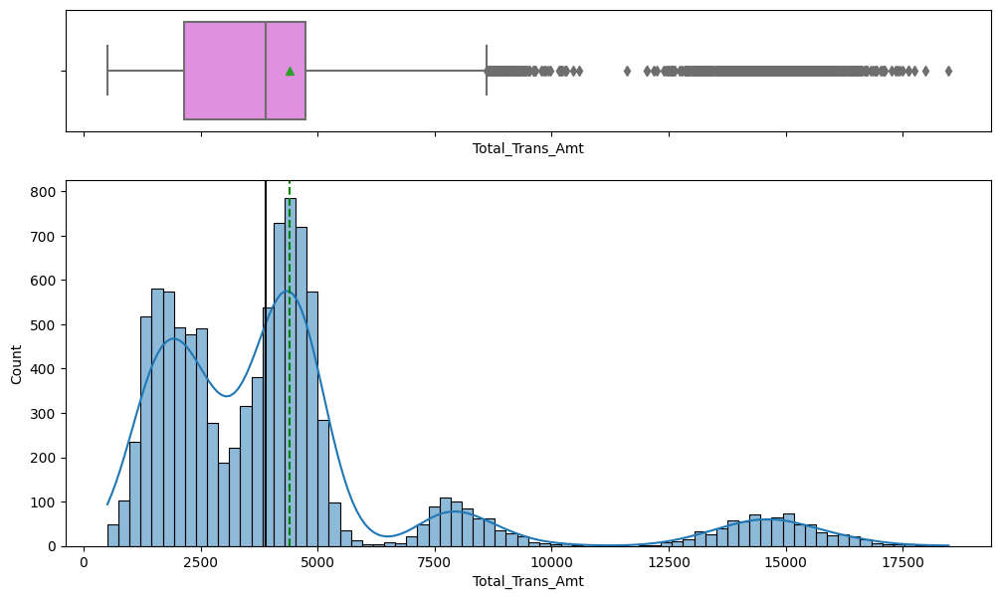

In [ ]:
histogram_boxplot(data_EDA,"Total_Trans_Amt",kde=True)

In [ ]:
data_EDA["Total_Trans_Amt"].mean()

4404.086303939963

In [ ]:
data_EDA["Total_Trans_Amt"].median()

3899.0

Total transaction amount Rightly skewed with having Outliers Mean=4404 and Median=3899

**3.1.11** **CHECKING Total_Trans_Ct**

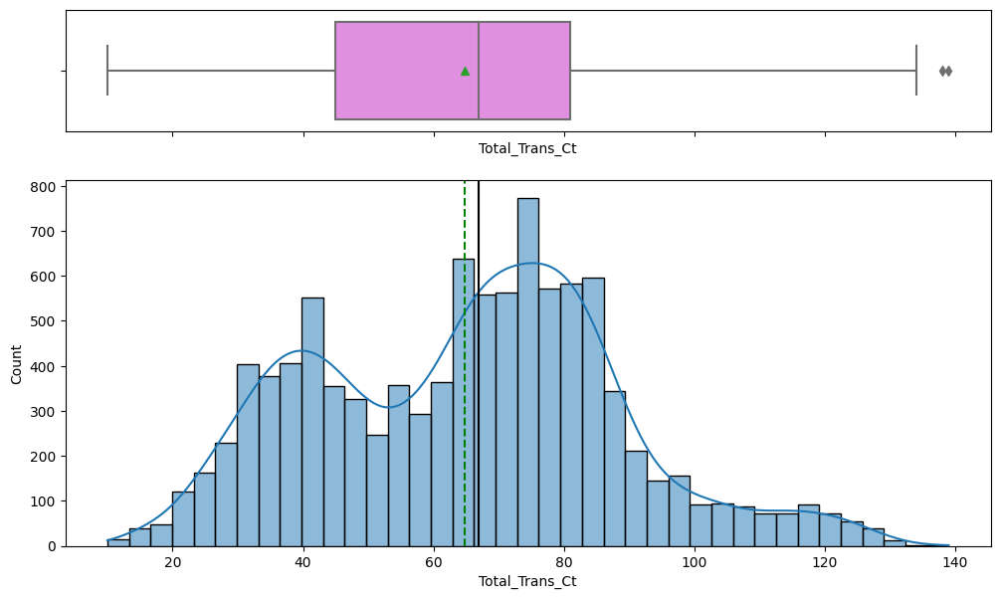

In [ ]:
histogram_boxplot(data_EDA,"Total_Trans_Ct",kde=True)

In [ ]:
data_EDA["Total_Trans_Ct"].mean()

64.85869457884863

In [ ]:
data_EDA["Total_Trans_Ct"].median()

67.0

Total Tansaction Count shows normal pattern having Outliers with Mean=64.8 and Median=67.0

**3.1.12** **CHECKING Total_Ct_Chng_Q4_Q1**


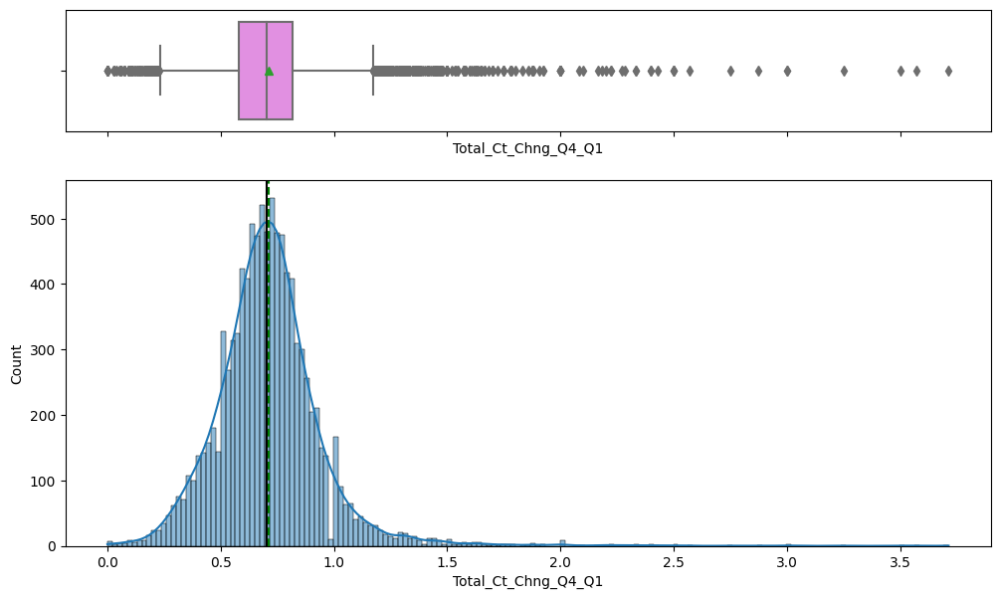

In [ ]:
histogram_boxplot(data_EDA,"Total_Ct_Chng_Q4_Q1",kde=True)

In [ ]:
data_EDA["Total_Ct_Chng_Q4_Q1"].mean()

0.7122223758269972

In [ ]:
data_EDA["Total_Ct_Chng_Q4_Q1"].median()

0.702

Total Tansaction Count Change Q4_Q1 shows Right having Outliers with Mean=0.71 and Median=0.70 .

**3.1.13** **CHECKING Avg_Utilization_Ratio**

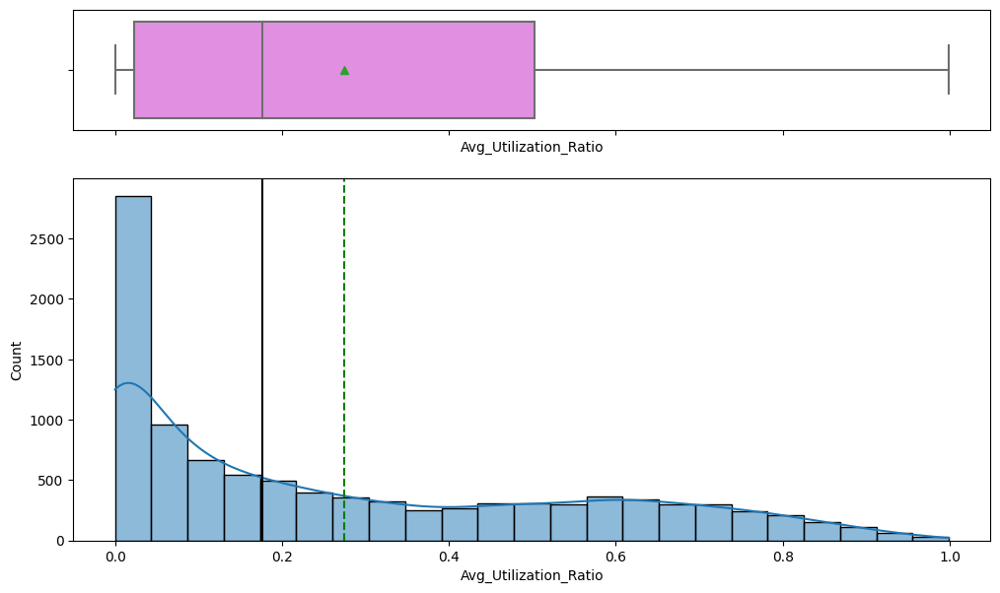

In [ ]:
histogram_boxplot(data_EDA,"Avg_Utilization_Ratio",kde=True)

Avg_Utilization_Ratio is Right skewed with Mean=0.27 and Median=0.274

In [ ]:
data_EDA["Avg_Utilization_Ratio"].mean()

0.2748935518909845

In [ ]:
data_EDA["Avg_Utilization_Ratio"].mean()

0.2748935518909845

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

**3.2** **BIVARIATE ANALYSIS**

Dropping Customer ID as no need for EDA analyzes

In [ ]:
data_EDA.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
data_EDA = data_EDA.drop(["CLIENTNUM"], axis=1)

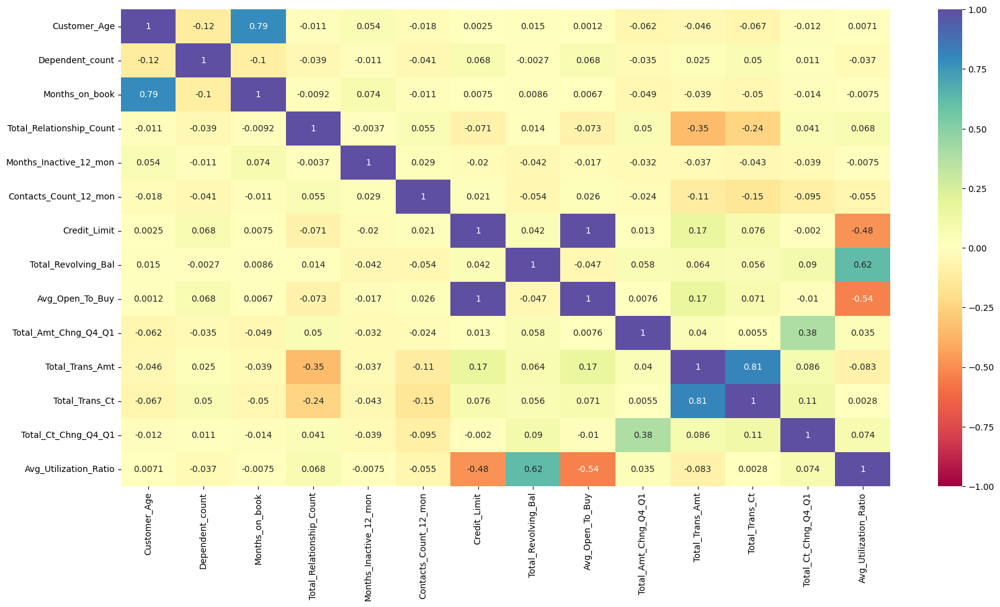

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(data_EDA.corr(),annot=True,cmap='Spectral',vmin=-1,vmax=1)
plt.show()

**OBSERVATIONS**



*`Avg_Utilization_Ratio` has a `POSITIVE` Correlation with `Total_Revolving_Balance` , this means that utilization increase revolving balance 

*`Avg_Utilization_Ratio` has a `NEGATIVE` Correlation with `Avg_Open_To_Buy`,this means that customers who cares for utilization less cares for new purchases

*`Avg_Utilization_Ratio` has a `NEGATIVE` Correlation with `Credit_Limit`,this means that customers who cares for utilization have less Credit Limit

*`Total_Trans_Amount` has a `NEGATIVE` Correlation with `Total_RelationShip_Count`,this means that customers who has more product from bank makes less transaction . Offering sellective product may be good for customers.

*`Avg_Open_To_Buy` has a `POSITIVE` Correlation with `Total_Trans_Amount` , this means that customers who are more intented for buyig have more total transaction amount.

*`Customers Age` has a `POSITIVE` Correlation with `Mounths On Book` , this means that older aged customers has a more longer period of relationship with the banks

*`Total_Trans_Amount` has a `POSITIVE` Correlation with `Credit_Limit` , this means that customers who make more transactions have more credit limit












**Differentiating Numerical Columns**

In [ ]:
numeric_cols = data_EDA.select_dtypes(include=[np.number]).columns

print("Numeric Columns:    ", numeric_cols)

Numeric Columns:     Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')


In [ ]:

data_EDA.groupby(["Attrition_Flag"])[numeric_cols].mean()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,,,,,,,,,,,,,,
Attrited Customer,46.659496,2.402581,36.178242,3.279656,2.693301,2.972342,8136.039459,672.822987,7463.216472,0.694277,3095.025814,44.933620,0.554386,0.162475
Existing Customer,46.262118,2.335412,35.880588,3.914588,2.273765,2.356353,8726.877518,1256.604118,7470.273400,0.772510,4654.655882,68.672588,0.742434,0.296412


**All Numerical Columns Analyzsis**

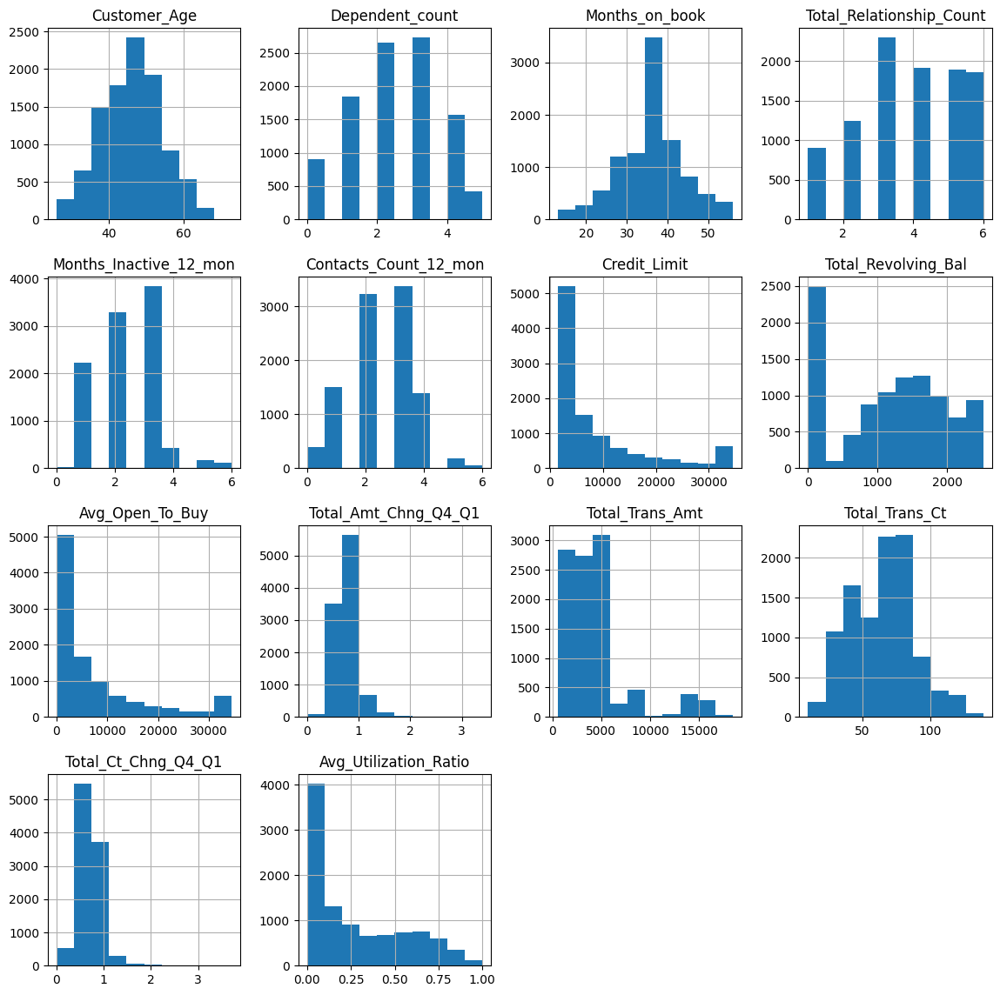

In [ ]:
data_EDA[numeric_cols].hist(figsize=(14, 14))
plt.show()

In [ ]:
data_EDA.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


**Age Vrs Total Relationship Count**

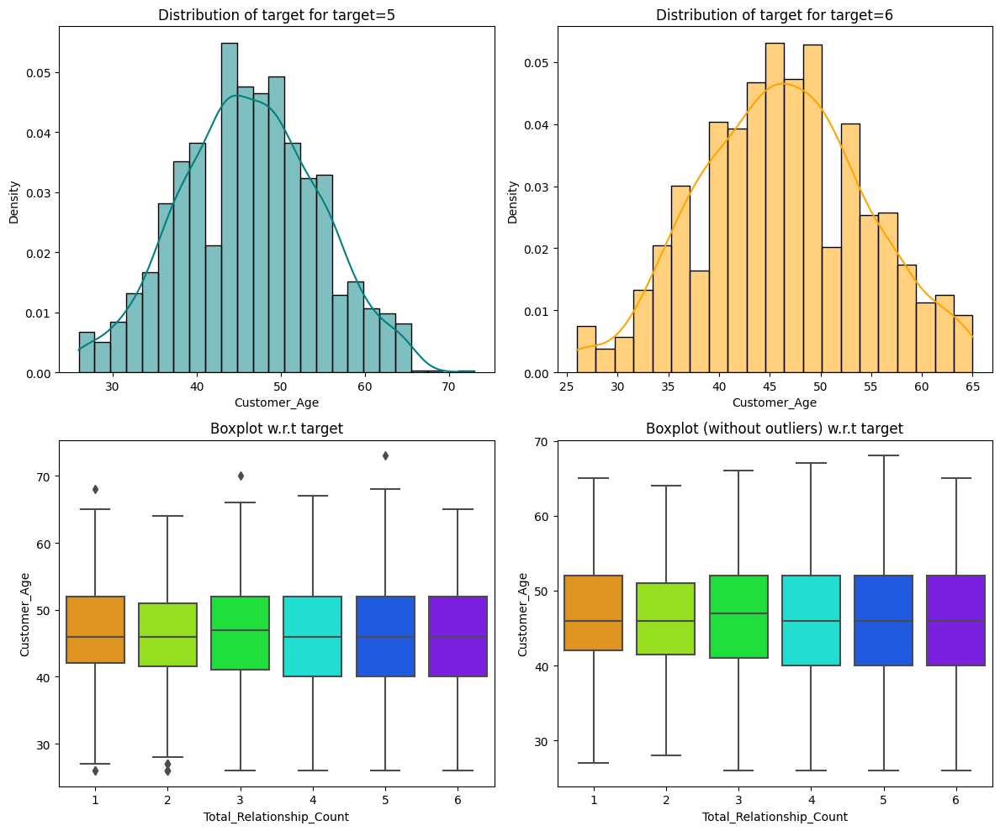

In [ ]:
distribution_plot_wrt_target(data_EDA, "Customer_Age", "Total_Relationship_Count")

Top demand for trips exits between Age of 45-50

**Customer Age Vrs Attrition_Flag**

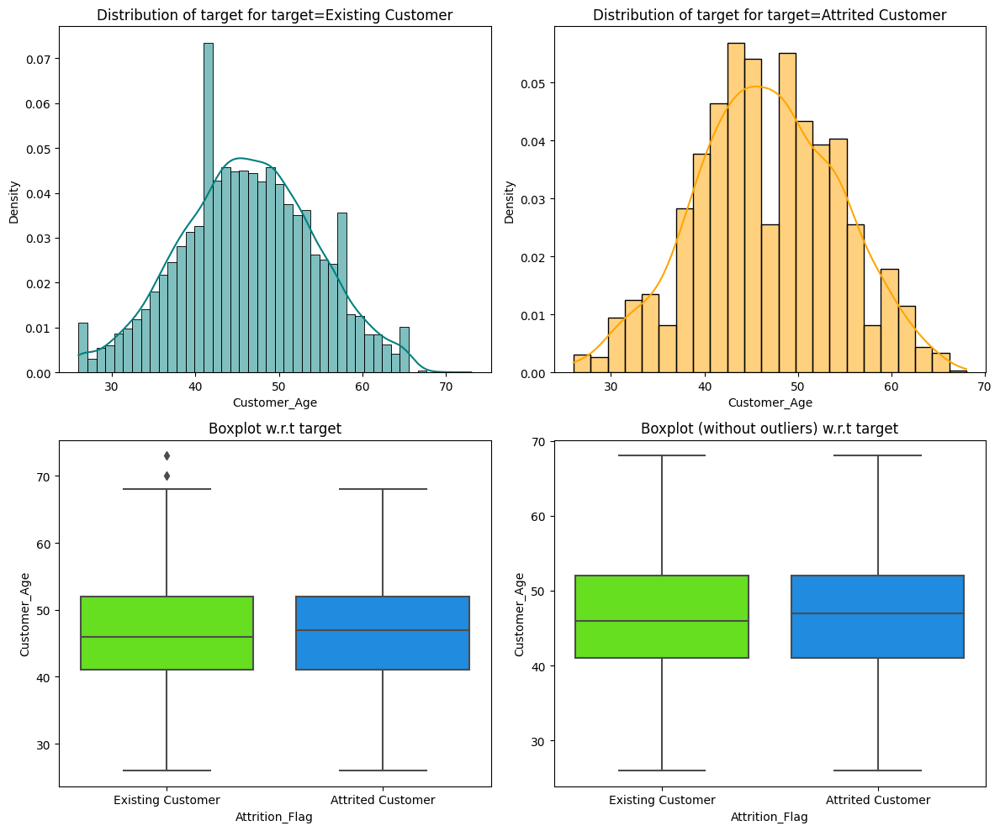

In [ ]:
distribution_plot_wrt_target(data_EDA, "Customer_Age", "Attrition_Flag")

Customers are so sensitive for Attrition between Age of 40-50

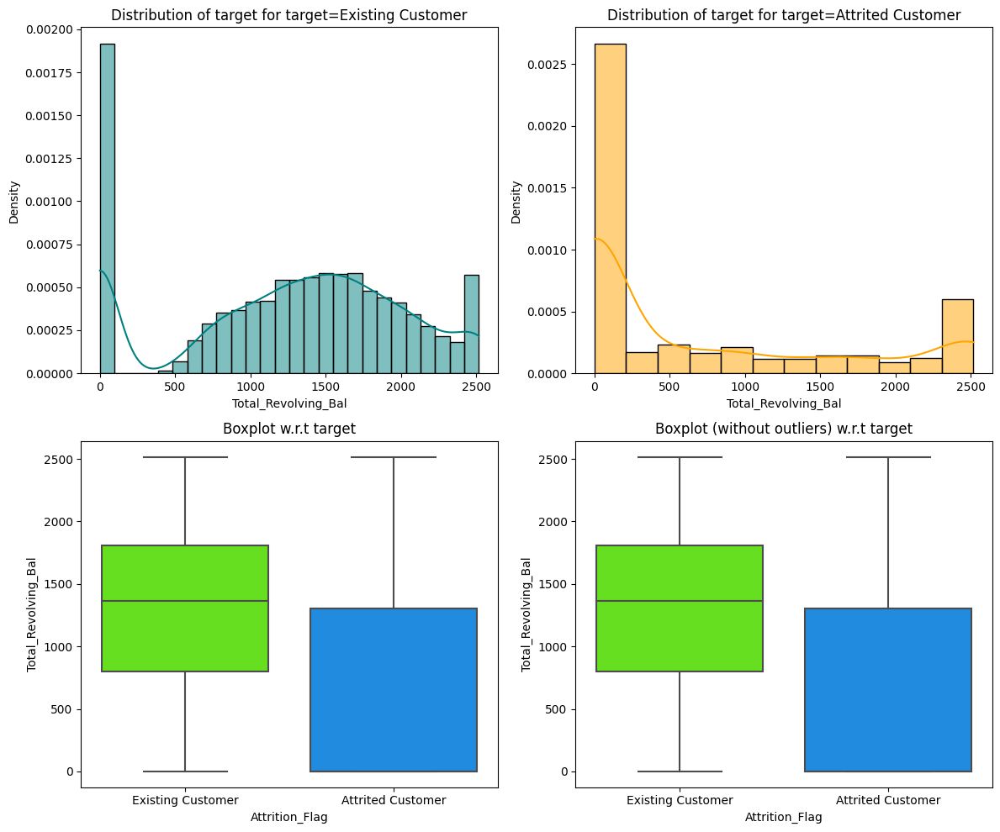

In [ ]:
distribution_plot_wrt_target(data_EDA, "Total_Revolving_Bal", "Attrition_Flag")

**Attrited customer shows a flat pattern but unattretited customers shows increasing pattern. This is a very good criteria to match customer attriation intent.**

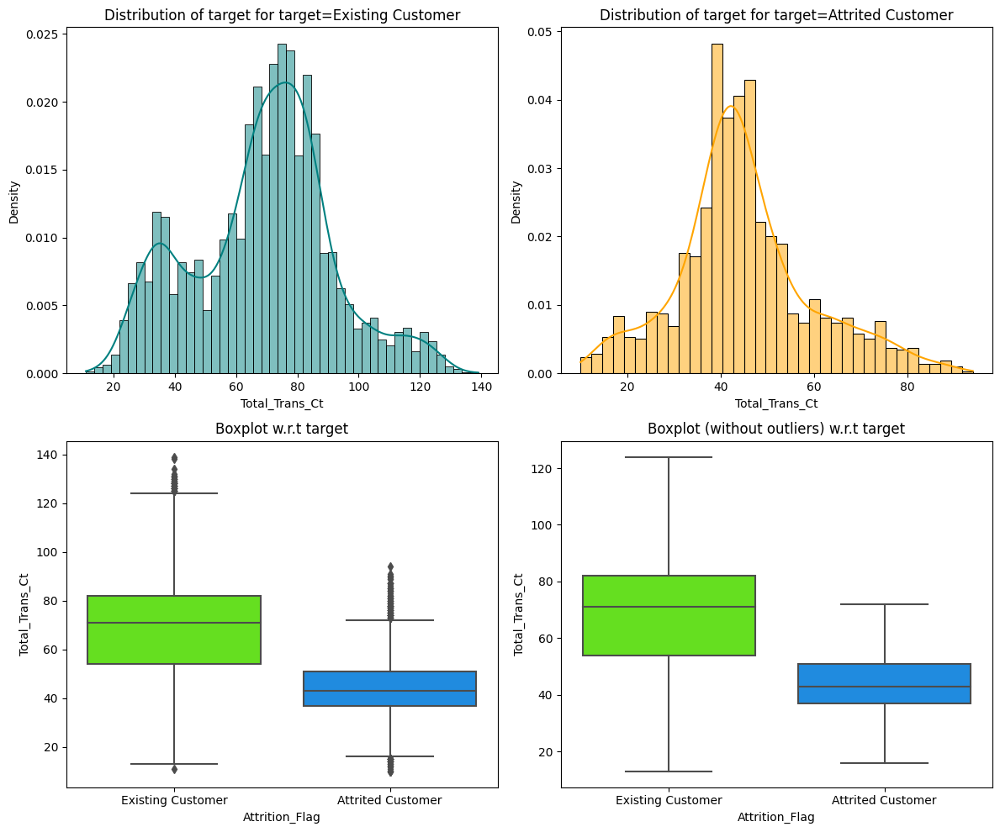

In [ ]:
distribution_plot_wrt_target(data_EDA, "Total_Trans_Ct", "Attrition_Flag")

**Pattern of existing customer transaction counts have more vriety than attriated customer. Attriated customer transaction pattern increases at some time of period but have deep decrease in short while.**

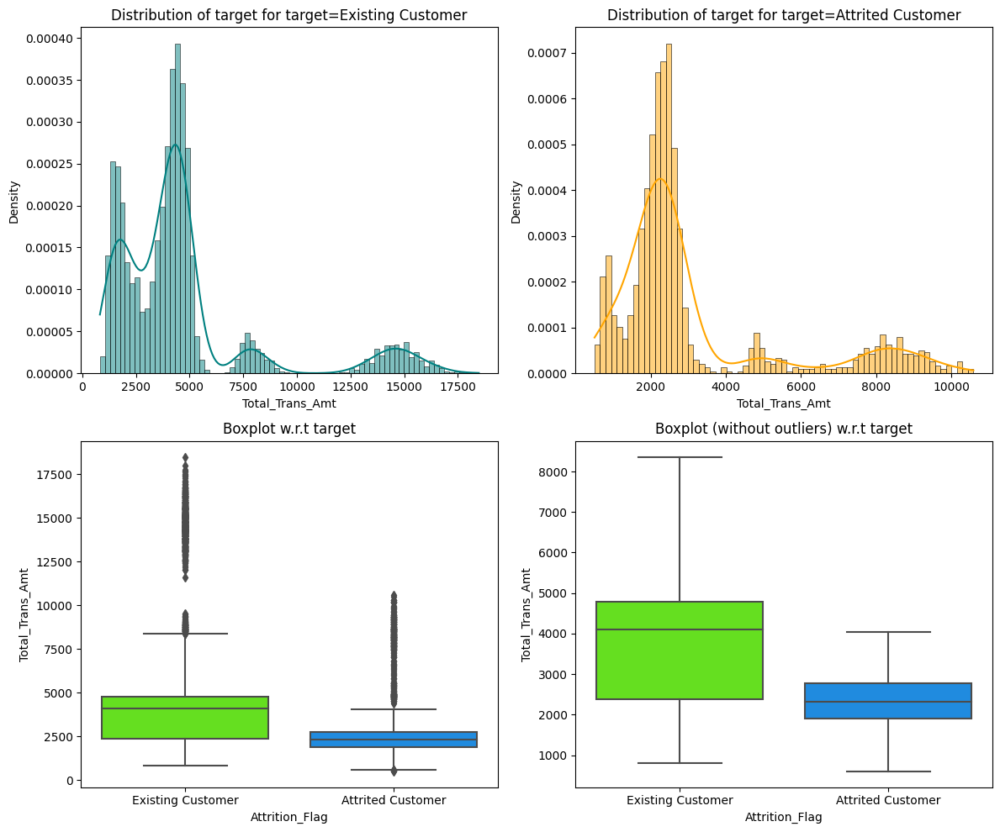

In [ ]:
distribution_plot_wrt_target(data_EDA, "Total_Trans_Amt", "Attrition_Flag")

**Existing customers show more total transaction amount pattern than attriated customers.**

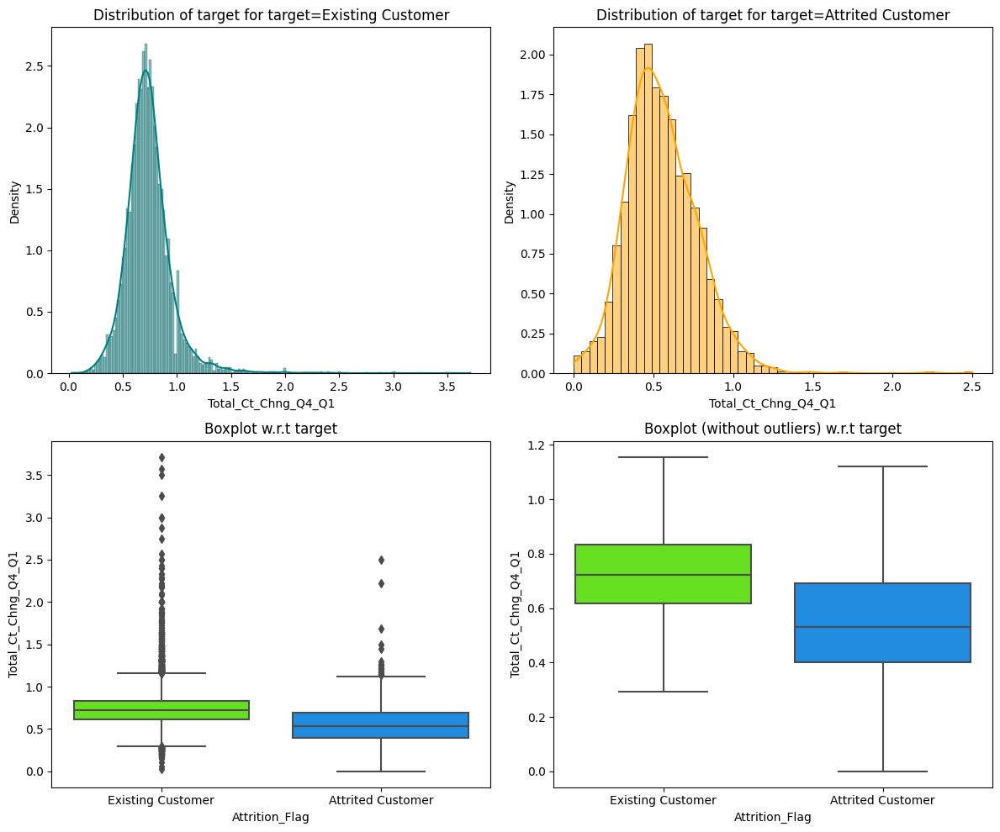

In [ ]:
distribution_plot_wrt_target(data_EDA, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag")

**Existing customers transaction counts change more than attrited customer**

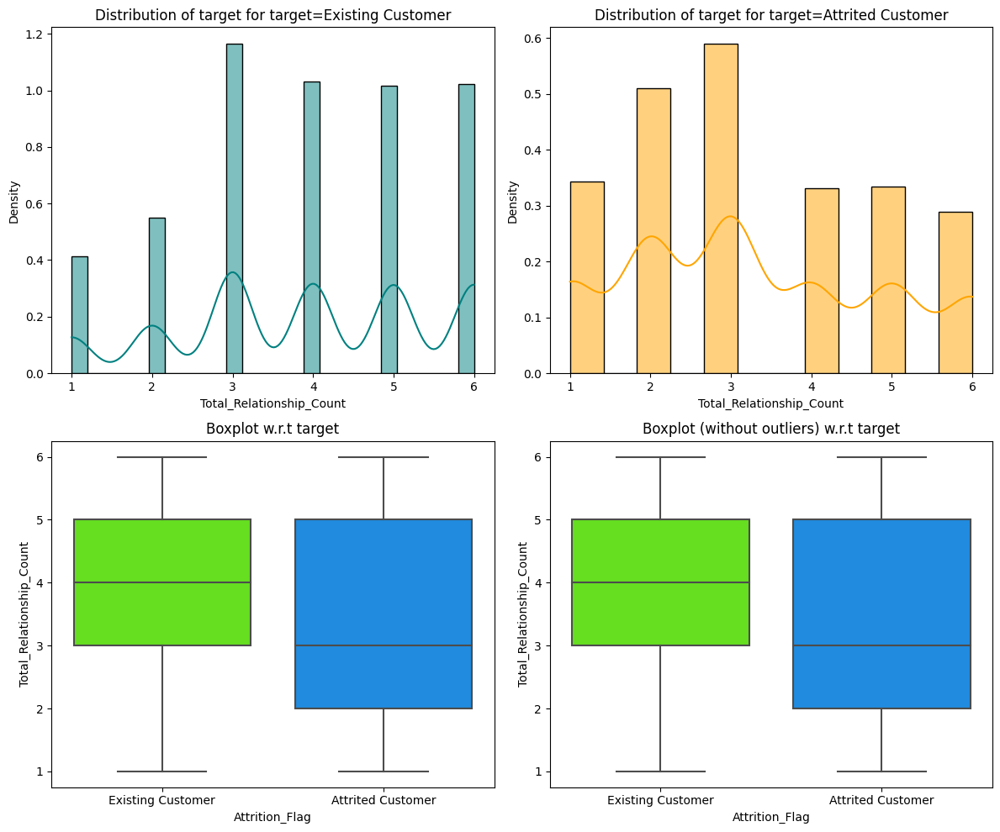

In [ ]:
distribution_plot_wrt_target(data_EDA, "Total_Relationship_Count", "Attrition_Flag")

**Existing customers show more uniformed distribution based on relationship count than attrited customer also they are having more relationships.**

**View of distribution based on Attrition_Flag**

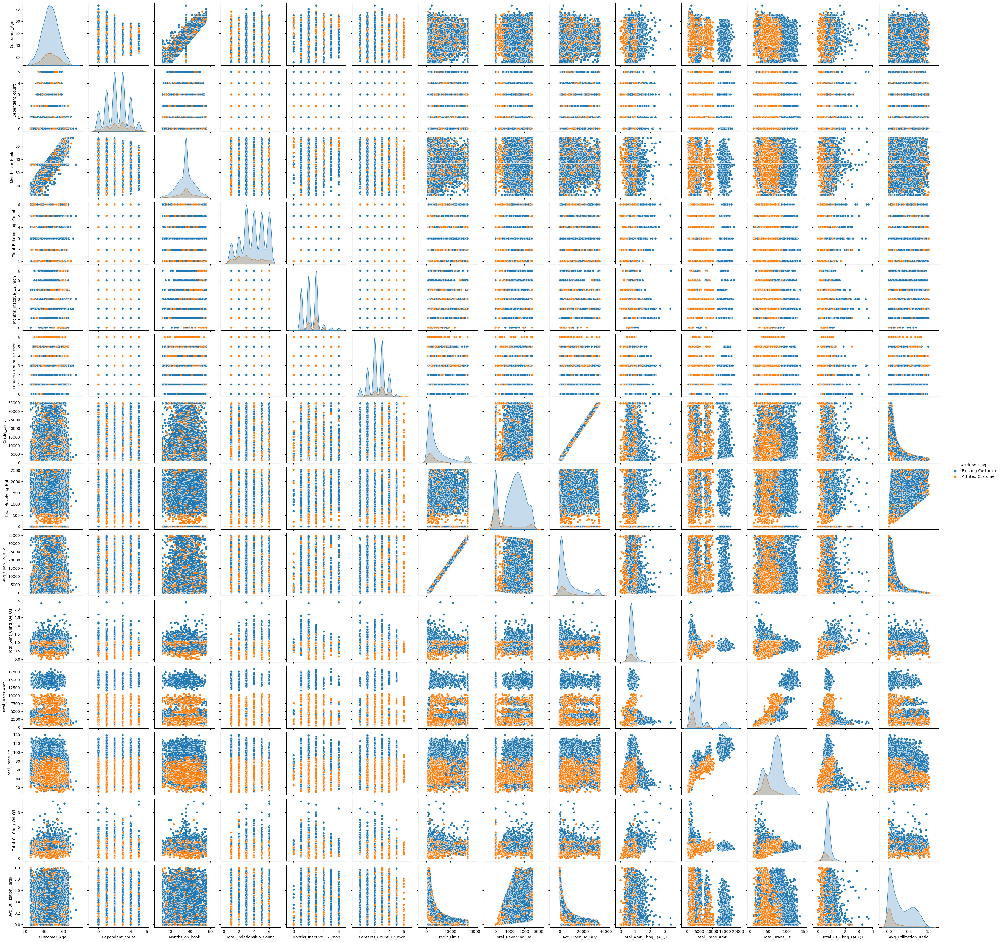

In [ ]:
sns.pairplot(data=data_EDA,hue="Attrition_Flag", diag_kind="kde")
plt.show()

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [ ]:
data_EDA.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


**Ditribution Of Age**

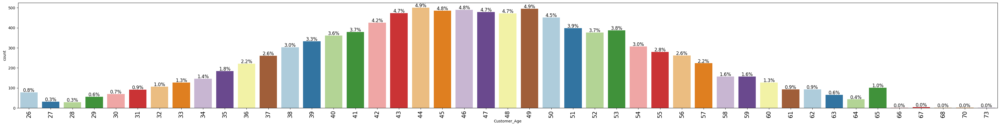

In [ ]:
labeled_barplot(data_EDA, "Customer_Age", perc=True)

Cunstomers has a high pick at age of 44 and 49

**Distribution of Attrition Flag**

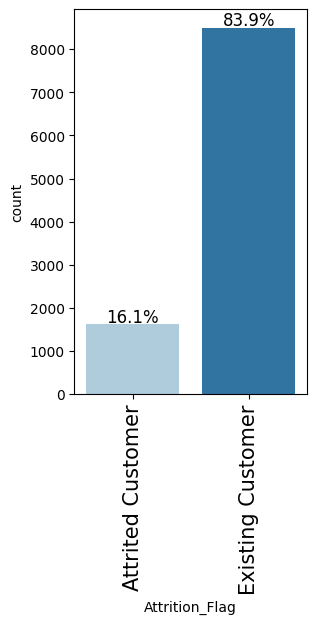

In [ ]:
labeled_barplot(data_EDA, "Attrition_Flag", perc=True)

%16.1 is Attrited Customer

**Income Category**

In [ ]:
data_EDA["Income_Category"].replace("abc", "Other", inplace=True)

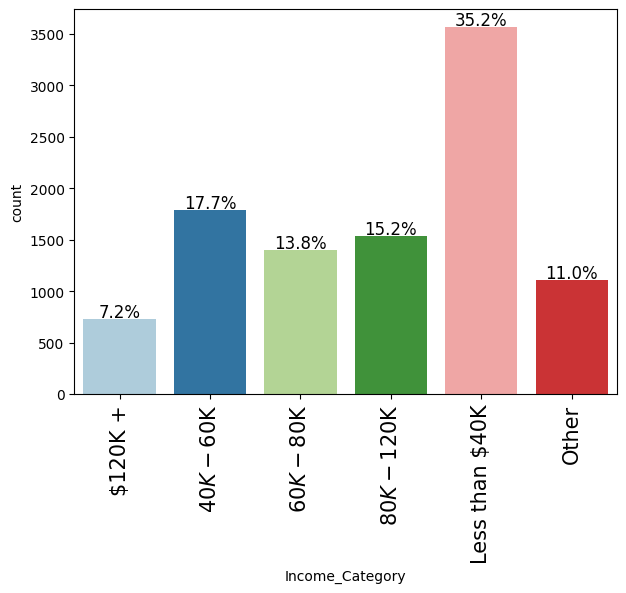

In [ ]:
labeled_barplot(data_EDA, "Income_Category", perc=True)

%35.2 biggest customer portfolio has less than 40K Income

**Distribution of Education**

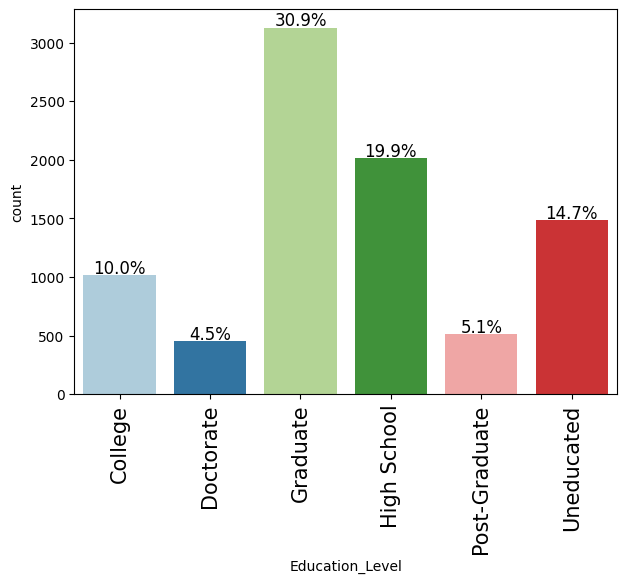

In [ ]:
labeled_barplot(data_EDA, "Education_Level", perc=True)

%30.9 has a graduate degree

**Mounths on Book Vrs Attrition Flag**

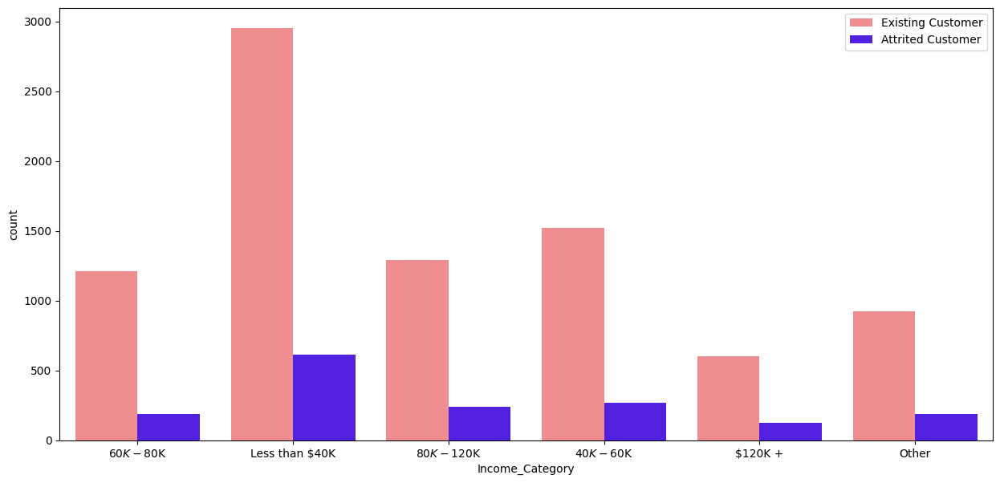

In [ ]:
plt.figure(figsize=(15,7))
sns.countplot(data = data_EDA, x = data_EDA["Income_Category"],hue=data_EDA["Attrition_Flag"],palette="gnuplot2_r")
plt.legend(bbox_to_anchor=(1.00, 1))
plt.show()

Attrition increases while income less than 40K

**Mounths on Book Vrs Attrition Flag**

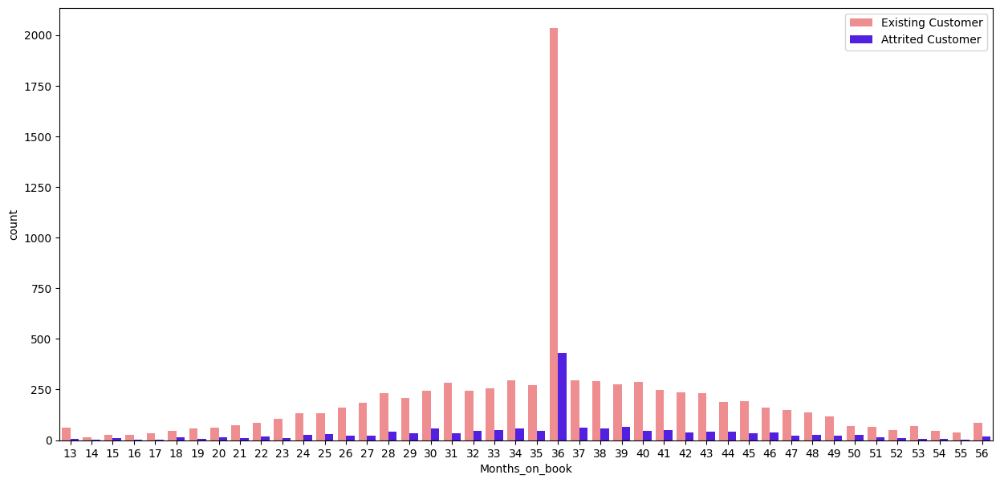

In [ ]:
plt.figure(figsize=(15,7))
sns.countplot(data = data_EDA, x = data_EDA["Months_on_book"],hue=data_EDA["Attrition_Flag"],palette="gnuplot2_r")
plt.legend(bbox_to_anchor=(1.00, 1))
plt.show()

Likewise Existing Customer , Attrited customer numbers increase after 3 years relationship with bank 
 

**Card Category Vrs Attrited Flag**

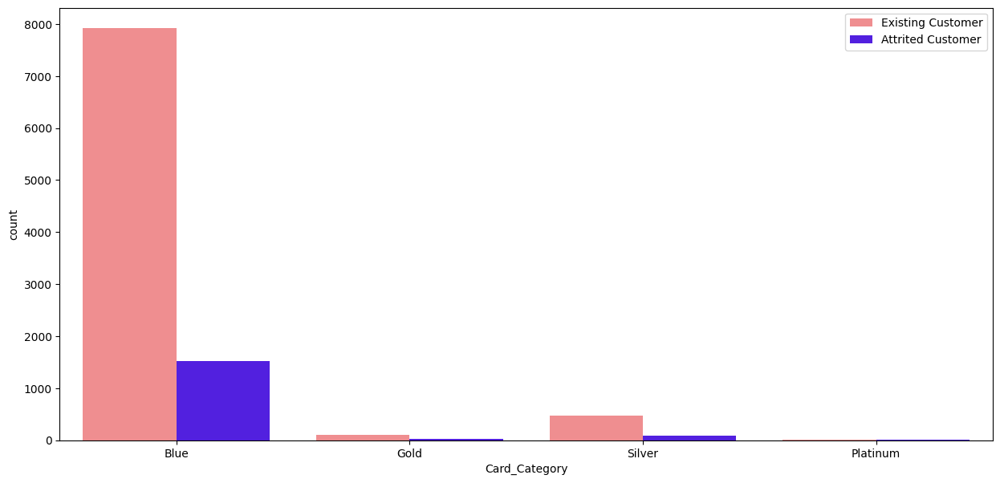

In [ ]:
plt.figure(figsize=(15,7))
sns.countplot(data = data_EDA, x = data_EDA["Card_Category"],hue=data_EDA["Attrition_Flag"],palette="gnuplot2_r")
plt.legend(bbox_to_anchor=(1.00, 1))
plt.show()

**Total_Relationship_Count Vrs Attrited Flag**

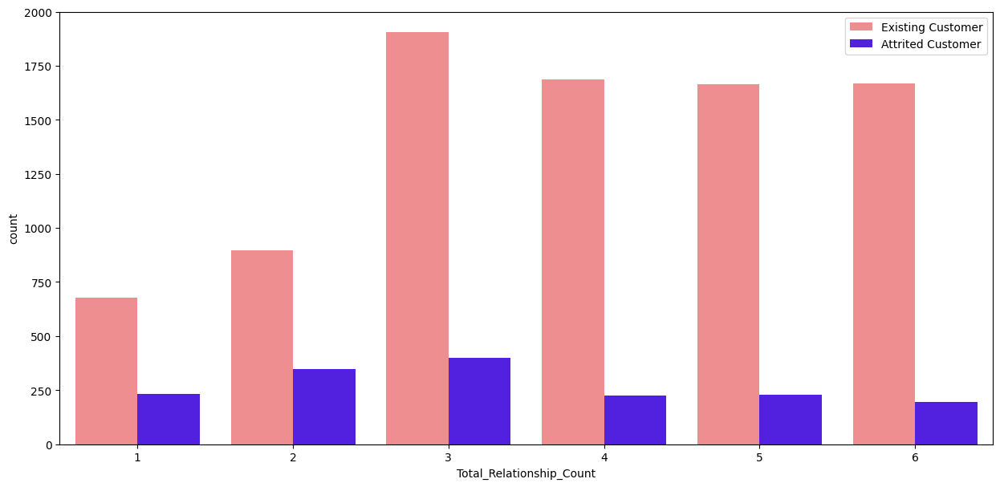

In [ ]:
plt.figure(figsize=(15,7))
sns.countplot(data = data_EDA, x = data_EDA["Total_Relationship_Count"],hue=data_EDA["Attrition_Flag"],palette="gnuplot2_r")
plt.legend(bbox_to_anchor=(1.00, 1))
plt.show()

Attrited Customer number increased with Total Relationship Count = 3

**Total Transacion Count vs Gender vs Attrition Flag**

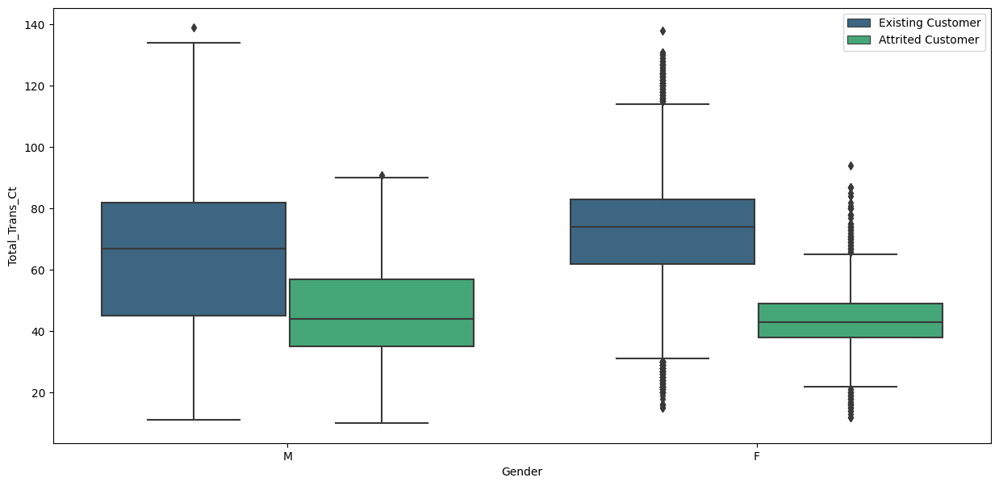

In [ ]:
plt.figure(figsize=(15,7))
sns.boxplot(data = data_EDA, x = data_EDA["Gender"], y = data_EDA["Total_Trans_Ct"],hue=data_EDA["Attrition_Flag"],palette="viridis")
plt.legend(bbox_to_anchor=(1.00, 1))
plt.show()

Attrited Customers are having less transaction counts

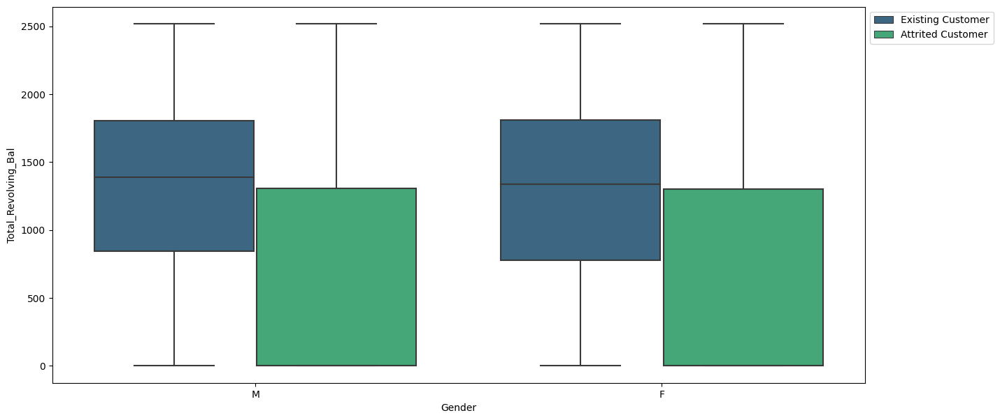

In [ ]:
plt.figure(figsize=(15,7))
sns.boxplot(data = data_EDA, x = data_EDA["Gender"], y = data_EDA["Total_Revolving_Bal"],hue=data_EDA["Attrition_Flag"],palette="viridis")
plt.legend(bbox_to_anchor=(1.00, 1))
plt.show()

##4-DATA PREPROSESSING

Copying data_EDA to data_pre_process Data Frame for abstraction

In [ ]:
data_pre_process=data_EDA.copy()

In [ ]:
data_pre_process.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [ ]:
cat_cols = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",    
]
#data_pre_process[cat_cols] = data_pre_process[cat_cols].astype("category")

In [ ]:
data_pre_process.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

**4.1** **Checking Categorial Columns**


**Checking Gender**

In [ ]:
print(data_pre_process.Gender.value_counts())

F    5358
M    4769
Name: Gender, dtype: int64


Female and Male two categories exits

**Checking Education Level**

In [ ]:
print(data_pre_process.Education_Level.value_counts())

Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64


In [ ]:
data_pre_process["Education_Level"] = data_pre_process["Education_Level"].replace(
    ["Graduate", "High School", "College","Post-Graduate","Doctorate"], "Educated"
)

In [ ]:
print(data_pre_process.Education_Level.value_counts())

Educated      7121
Uneducated    1487
Name: Education_Level, dtype: int64


All Education Level collected in two categories "Educated","Uneducated"

**Checking Marital Status**


In [ ]:
print(data_pre_process.Marital_Status.value_counts())

Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64


In [ ]:
data_pre_process["Marital_Status"] = data_pre_process["Marital_Status"].replace(
    ["Single", "Divorced"], "Single"
)

In [ ]:
print(data_pre_process.Marital_Status.value_counts())

Single     4691
Married    4687
Name: Marital_Status, dtype: int64


Marital Status Combined into two categories which is Single,Married

**Checking Income Category**



In [ ]:
print(data_pre_process.Income_Category.value_counts())

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Other             1112
$120K +            727
Name: Income_Category, dtype: int64


With 'Other' 6 categories exits

In [ ]:
data_pre_process.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,Educated,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Educated,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Educated,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,Educated,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


**4.2** **Feature Enginering**

**Data Leak Prevention**

**I WILL impute missing values after splitting the data into Training , Validation and Test not to cause a Data Leak**

Using **MAP** Function to convert categorical values

**4.2.1** **Education Level**

Convert Educated :1 Uneducated:0 for Model Analyzes since model analyzes only numerical values

In [ ]:
education_level = {
    "Uneducated": 0,
    "Educated": 1,    
}

In [ ]:
data_pre_process['Education_Level']=data_pre_process['Education_Level'].map(education_level)

In [ ]:
print(data_pre_process.Education_Level.value_counts())

1.0    7121
0.0    1487
Name: Education_Level, dtype: int64


**4.2.2** **Marital_Status**

In [ ]:
MaritalStatus = {
    "Single": 0,
    "Married": 1,    
}

In [ ]:
data_pre_process['Marital_Status']=data_pre_process['Marital_Status'].map(MaritalStatus)

In [ ]:
print(data_pre_process.Marital_Status.value_counts())

0.0    4691
1.0    4687
Name: Marital_Status, dtype: int64


**4.2.3** **Income_Category**

In [ ]:
print(data_pre_process.isna().sum())

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64


In [ ]:
print(data_pre_process.Income_Category.value_counts())

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Other             1112
$120K +            727
Name: Income_Category, dtype: int64


In [ ]:
InComeCategory={"Less than $40K":0,"$40K - $60K":1,"$60K - $80K":2,"$80K - $120K":3,"$120K +":4,"Other":5}

In [ ]:
data_pre_process['Income_Category']=data_pre_process['Income_Category'].map(InComeCategory)

In [ ]:
print(data_pre_process.Income_Category.value_counts())

0    3561
1    1790
3    1535
2    1402
5    1112
4     727
Name: Income_Category, dtype: int64


**4.2.4** **Card_Category**

In [ ]:
print(data_pre_process.Card_Category.value_counts())

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64


In [ ]:
CardCategory={"Blue":0,"Silver":1,"Gold":2,"Platinum":3}

In [ ]:
data_pre_process['Card_Category']=data_pre_process['Card_Category'].map(CardCategory)

In [ ]:
print(data_pre_process.Card_Category.value_counts())

0    9436
1     555
2     116
3      20
Name: Card_Category, dtype: int64


**4.2.4** **Attrition_Flag**

In [ ]:
print(data_pre_process.Attrition_Flag.value_counts())

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64


In [ ]:
AttritionFlag={"Existing Customer":0,"Attrited Customer":1}

In [ ]:
data_pre_process['Attrition_Flag']=data_pre_process['Attrition_Flag'].map(AttritionFlag)

In [ ]:
print(data_pre_process.Attrition_Flag.value_counts())

0    8500
1    1627
Name: Attrition_Flag, dtype: int64


In [ ]:
data_pre_process.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,1.0,1.0,2,0,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,F,5,1.0,0.0,0,0,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,M,3,1.0,1.0,3,0,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,F,4,1.0,NaN,0,0,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,M,3,0.0,1.0,2,0,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


# **4.3** **Prevent Data Leak Split Data Into Train,Validation,Test** 
# **Outlier Treatment,Missing Parameter Treatment will be done for each set seperately**


In [ ]:
data_model=data_pre_process.copy()

In [ ]:
data_model.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,1.0,1.0,2,0,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,F,5,1.0,0.0,0,0,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,M,3,1.0,1.0,3,0,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,F,4,1.0,NaN,0,0,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,M,3,0.0,1.0,2,0,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
X=data_model.drop(["Attrition_Flag"], axis=1)

In [ ]:
y=data_model["Attrition_Flag"]

In [ ]:
# Splitting data into training, validation and test set:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


In [ ]:
print("Number of rows in train data =", X_train.shape[0])
print("Number of rows in validation data =", X_val.shape[0])
print("Number of rows in test data =", X_test.shape[0])

Number of rows in train data = 6075
Number of rows in validation data = 2026
Number of rows in test data = 2026


**4.4** **Imputing Missing Values**

In [ ]:
imputer = KNNImputer(n_neighbors=5)

Education Level and Marital Status needs missing value treatment

In [ ]:
reqd_col_for_impute = [
    "Education_Level",
    "Marital_Status",    
]

In [ ]:
# Fit and transform the train data
X_train[reqd_col_for_impute] = imputer.fit_transform(X_train[reqd_col_for_impute])

# Transform the val data
X_val[reqd_col_for_impute] = imputer.transform(X_val[reqd_col_for_impute])

# Transform the test data
X_test[reqd_col_for_impute] = imputer.transform(X_test[reqd_col_for_impute])

In [ ]:
# Checking that no column has missing values in train, validation or test sets
print(X_train.isna().sum())
print("-" * 30)
print(X_val.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal       

All missing values imputed 

Inverse the map the encoded 

In [ ]:
## Function to inverse the encoding
def inverse_mapping(x, y):
    inv_dict = {v: k for k, v in x.items()}
    X_train[y] = np.round(X_train[y]).map(inv_dict).astype("category")
    X_val[y] = np.round(X_val[y]).map(inv_dict).astype("category")
    X_test[y] = np.round(X_test[y]).map(inv_dict).astype("category")

In [ ]:
inverse_mapping(education_level, "Education_Level")
inverse_mapping(MaritalStatus, "Marital_Status")
inverse_mapping(InComeCategory, "Income_Category")


In [ ]:
inverse_mapping(CardCategory, "Card_Category")

**Checking Training Set Values**

In [ ]:
cols = X_train.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_train[i].value_counts())
    print("*" * 30)

F    3193
M    2882
Name: Gender, dtype: int64
******************************
Educated      5194
Uneducated     881
Name: Education_Level, dtype: int64
******************************
Single     3112
Married    2963
Name: Marital_Status, dtype: int64
******************************
Less than $40K    2129
$40K - $60K       1059
$80K - $120K       953
$60K - $80K        831
Other              654
$120K +            449
Name: Income_Category, dtype: int64
******************************
Blue        5655
Silver       339
Gold          69
Platinum      12
Name: Card_Category, dtype: int64
******************************


**Checking Validation Set Values**

In [ ]:
cols = X_val.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_val[i].value_counts())
    print("*" * 30)

F    1095
M     931
Name: Gender, dtype: int64
******************************
Educated      1720
Uneducated     306
Name: Education_Level, dtype: int64
******************************
Single     1031
Married     995
Name: Marital_Status, dtype: int64
******************************
Less than $40K    736
$40K - $60K       361
$80K - $120K      293
$60K - $80K       279
Other             221
$120K +           136
Name: Income_Category, dtype: int64
******************************
Blue        1905
Silver        97
Gold          21
Platinum       3
Name: Card_Category, dtype: int64
******************************


**Checking Test Set Values**

In [ ]:
cols = X_test.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_test[i].value_counts())
    print("*" * 30)

F    1070
M     956
Name: Gender, dtype: int64
******************************
Educated      1726
Uneducated     300
Name: Education_Level, dtype: int64
******************************
Single     1074
Married     952
Name: Marital_Status, dtype: int64
******************************
Less than $40K    696
$40K - $60K       370
$60K - $80K       292
$80K - $120K      289
Other             237
$120K +           142
Name: Income_Category, dtype: int64
******************************
Blue        1876
Silver       119
Gold          26
Platinum       5
Name: Card_Category, dtype: int64
******************************


**4.5** **Outlier Treatment On Numerical Columns**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [ ]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [ ]:
# functions to treat outliers by flooring and capping


def treat_outliers(df, col):
    """
    Treats outliers in a variable

    df: dataframe
    col: dataframe column
    """
    Q1 = df[col].quantile(0.25)  # 25th quantile
    Q3 = df[col].quantile(0.75)  # 75th quantile
    IQR = Q3 - Q1
    Lower_Whisker = Q1 - 1.5 * IQR
    Upper_Whisker = Q3 + 1.5 * IQR

    # all the values smaller than Lower_Whisker will be assigned the value of Lower_Whisker
    # all the values greater than Upper_Whisker will be assigned the value of Upper_Whisker
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker)

    return df


def treat_outliers_all(df, col_list):
    """
    Treat outliers in a list of variables

    df: dataframe
    col_list: list of dataframe columns
    """
    for c in col_list:
        df = treat_outliers(df, c)

    return df

**4.5.1** **Outlier Treatment On Training Set**

In [ ]:
numerical_col=X_train.select_dtypes(include=np.number).columns.tolist()

In [ ]:
numerical_col

['Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

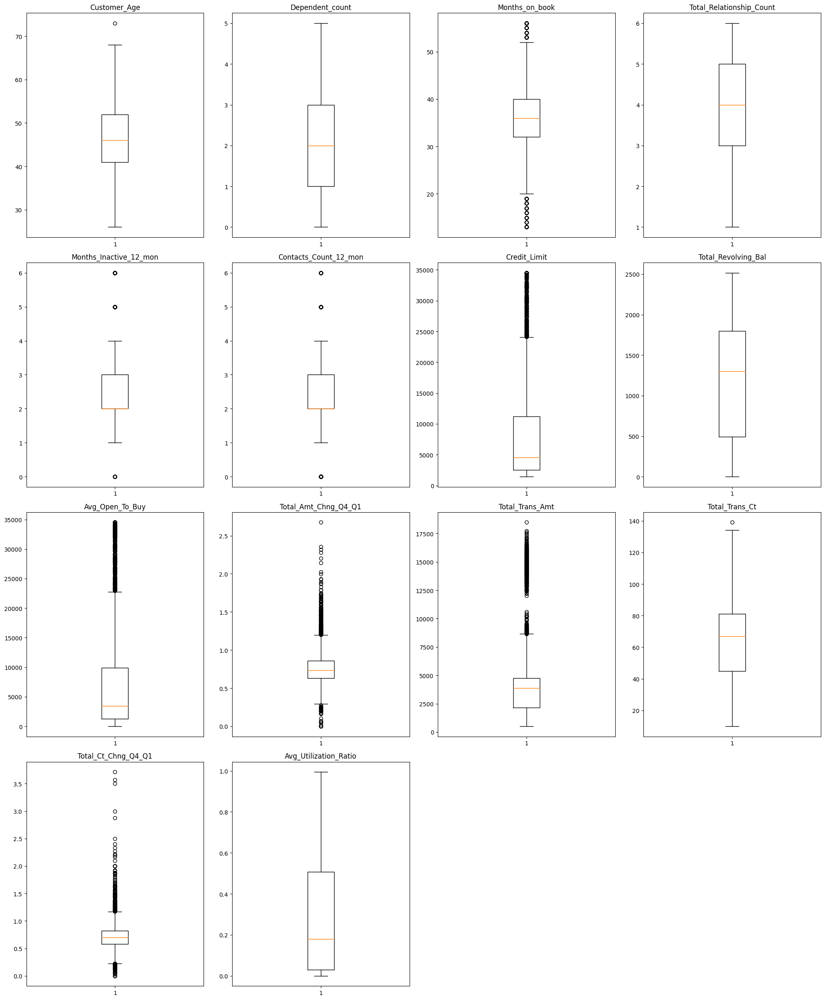

In [ ]:
numerical_col = X_train.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_col):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(X_train[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

**Outliers Treated for Training Data Set**

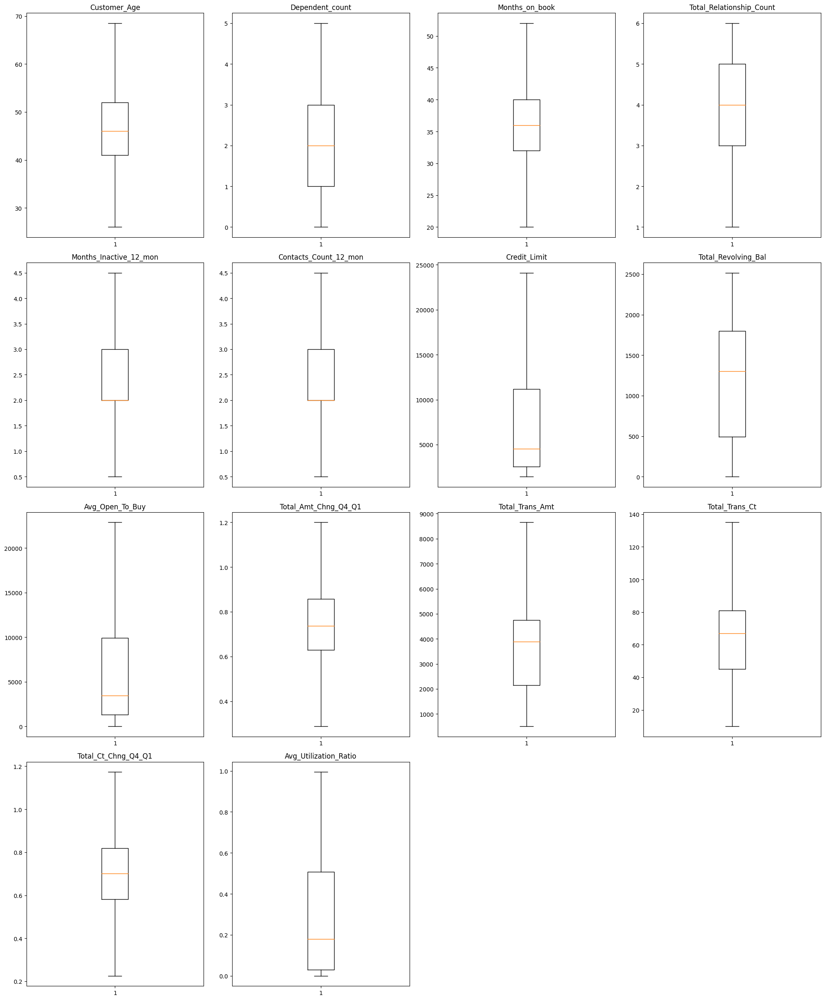

In [ ]:
numerical_col = X_train.select_dtypes(include=np.number).columns.tolist()
X_train = treat_outliers_all(X_train, numerical_col)
# let's look at box plot to see if outliers have been treated or not
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_col):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(X_train[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

**4.5.2** **Outlier Treatment On Validation Set**

In [ ]:
numerical_col=X_val.select_dtypes(include=np.number).columns.tolist()

In [ ]:
numerical_col

['Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

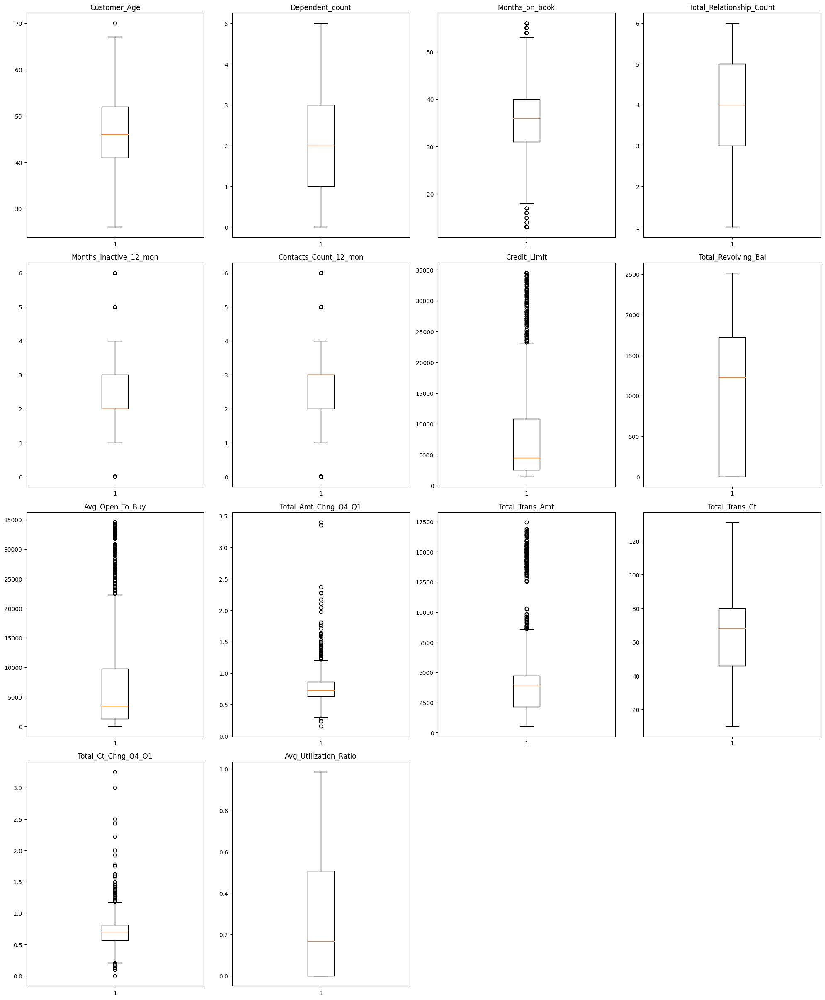

In [ ]:
numerical_col = X_val.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_col):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(X_val[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

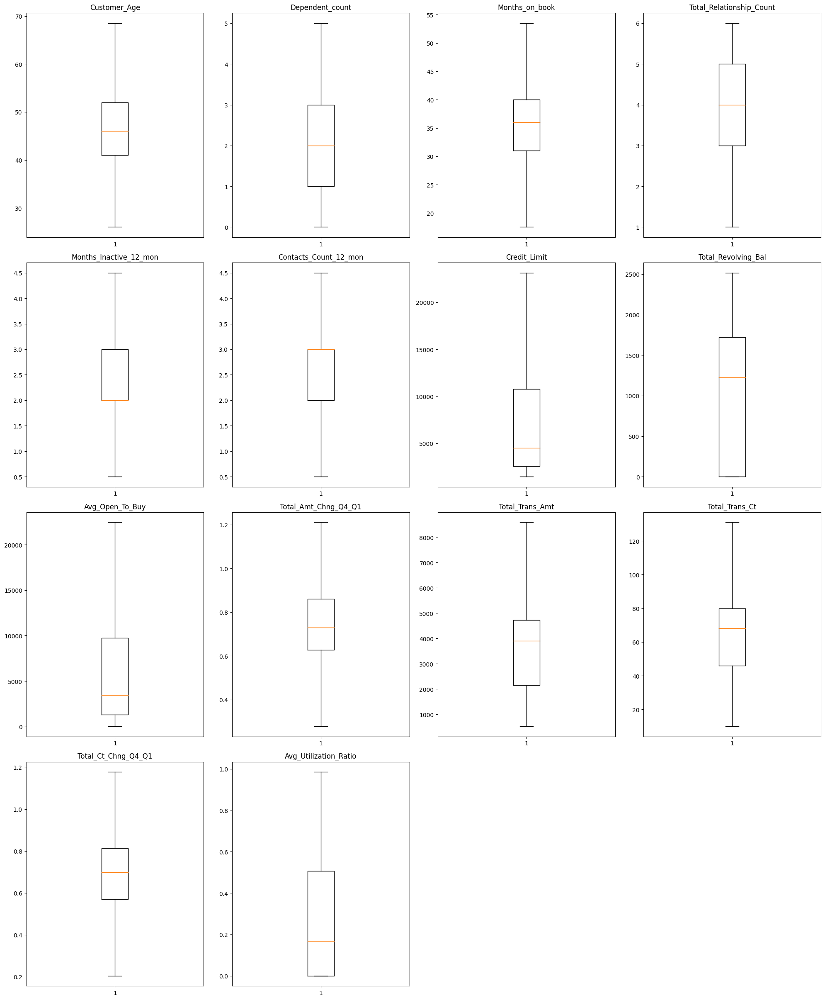

In [ ]:
numerical_col = X_val.select_dtypes(include=np.number).columns.tolist()
X_val = treat_outliers_all(X_val, numerical_col)
# let's look at box plot to see if outliers have been treated or not
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_col):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(X_val[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

**Outliers Treated for Validation Data Set**

**4.5.3** **Outlier Treatment On Test Set**

In [ ]:
numerical_col=X_test.select_dtypes(include=np.number).columns.tolist()

In [ ]:
numerical_col

['Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

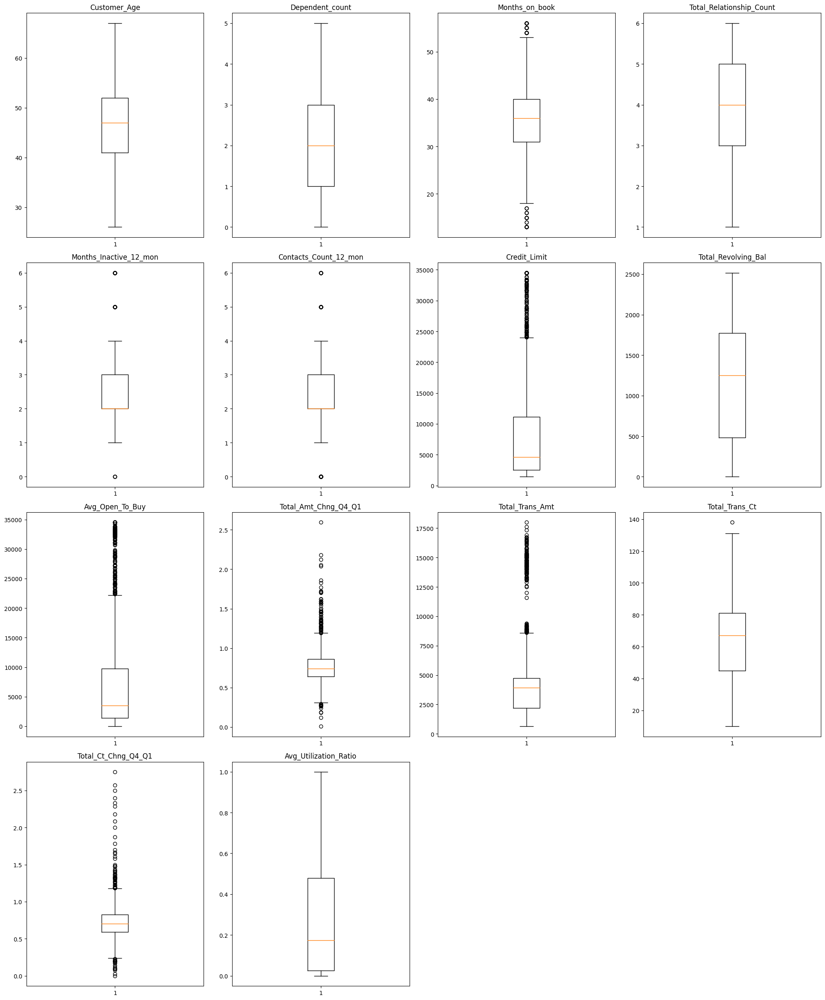

In [ ]:
numerical_col = X_test.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_col):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(X_test[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

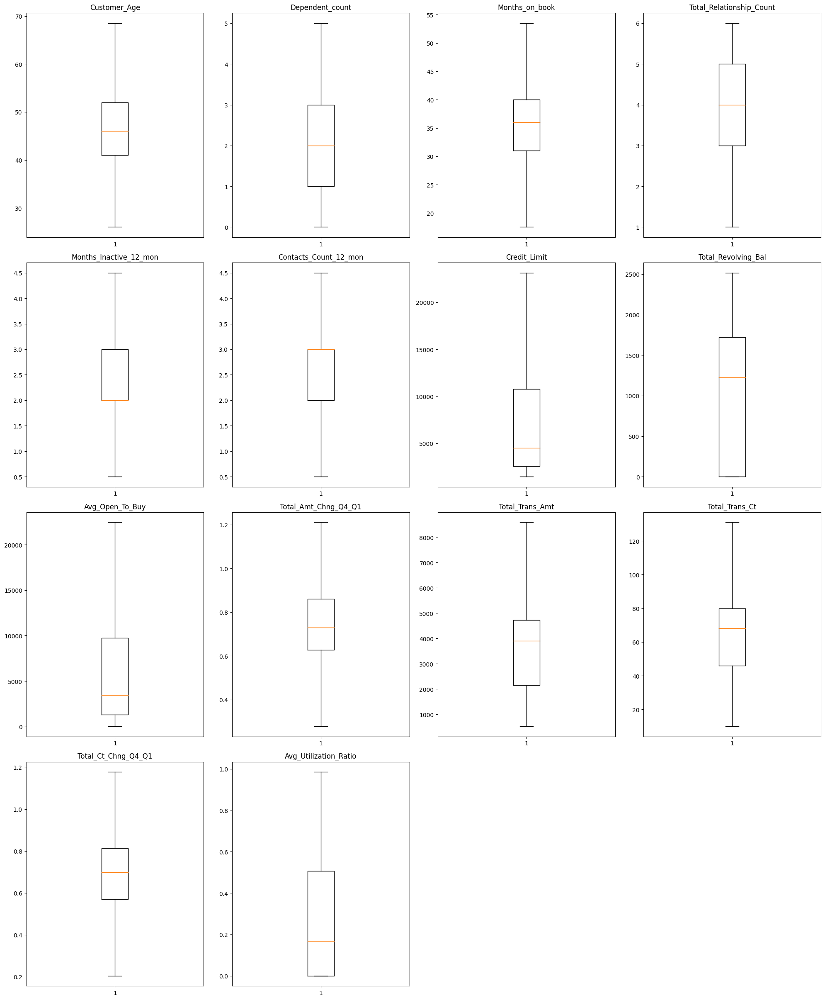

In [ ]:
numerical_col = X_test.select_dtypes(include=np.number).columns.tolist()
X_test = treat_outliers_all(X_test, numerical_col)
# let's look at box plot to see if outliers have been treated or not
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numerical_col):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(X_val[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

**Outliers Treated for Test Data Set**

**4.6** **Creating Dummy Variables On Training,Validation And Test**

In [ ]:
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 25) (2026, 25) (2026, 25)


In [ ]:
X_train

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Education_Level_Uneducated,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Other,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
800,40.0,2,21,6,4.0,3.0,20056.0,1602,18454.00,0.466,1687.00,46,0.533,0.080,1,0,1,0,0,0,0,0,0,0,0
498,44.0,1,34,6,2.0,0.5,2885.0,1895,990.00,0.387,1366.00,31,0.632,0.657,1,0,0,0,0,0,0,1,0,0,0
4356,48.0,4,36,5,1.0,2.0,6798.0,2517,4281.00,0.873,4327.00,79,0.881,0.370,1,0,0,0,0,1,0,0,0,0,0
407,41.0,2,36,6,2.0,0.5,24109.5,0,22886.25,0.610,1209.00,39,0.300,0.000,1,0,1,0,1,0,0,0,0,0,1
8728,46.0,4,36,2,2.0,3.0,15034.0,1356,13678.00,0.754,7737.00,84,0.750,0.090,1,0,1,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
987,47.0,2,36,6,2.0,2.0,5145.0,0,5145.00,0.693,1588.00,35,0.944,0.000,0,0,1,0,0,0,1,0,0,0,0
5633,47.0,3,36,3,3.0,4.0,24109.5,0,22886.25,0.517,2020.00,33,0.375,0.000,1,1,1,0,0,0,0,0,0,0,0
9621,50.0,0,36,3,4.0,1.0,3468.0,2221,1247.00,0.783,8653.25,122,0.627,0.640,0,0,1,0,0,0,1,0,0,0,0
593,45.0,4,38,3,4.0,3.0,4908.0,0,4908.00,0.993,827.00,21,0.750,0.000,0,1,0,0,0,0,1,0,0,0,0


##5-BUILDING MODEL

MODEL CAN MAKE A WROG PREDICTIONS AS:

1.Predicting a customer will not renounce their Credit Cards but they are: Loss of customers  due to wrong prediction - Recall

2.Predicting a customer will renounce their Credit Cards but they are not: Loss of resources -Precision

I chose `F1 score` since both Loss of Customer and Loss of Resources are good source of truth for improving credit card services

**5.1** **Cross Validation Performance of 6 Models On Training Set**

**5.1.1** **Model 1 Logistic Regression**

In [ ]:
lr = LogisticRegression(random_state=1)
lr.fit(X_train, y_train)

LogisticRegression(random_state=1)

**Let's evaluate the model performance by using KFold and cross_val_score**

- `K-Folds cross-validation` provides dataset indices to split data into train/validation sets. Split dataset into k consecutive stratified folds (without shuffling by default). Each fold is then used once as validation while the k - 1 remaining folds form the training set.

- `Stratified K-fold` is a variation of KFold that returns stratified folds. The folds are made by preserving the percentage of samples for each class.

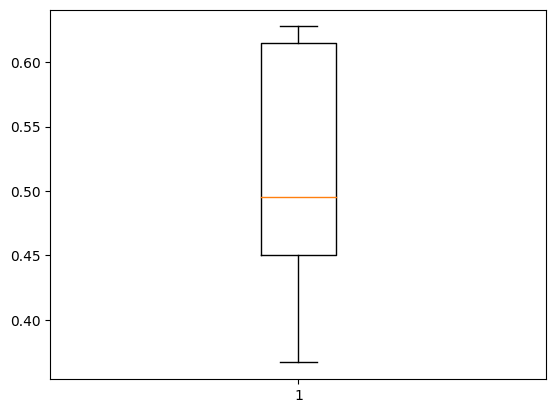

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=lr, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
# Calculating different metrics on train set
log_reg_model_train_perf = model_performance_classification_sklearn(
    lr, X_train, y_train
)
print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.884444,0.472336,0.71142,0.567734


In [ ]:
# Calculating different metrics on validation set
log_reg_model_val_perf = model_performance_classification_sklearn(lr, X_val, y_val)
print("Validation performance:")
log_reg_model_val_perf

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.893386,0.521472,0.73913,0.611511


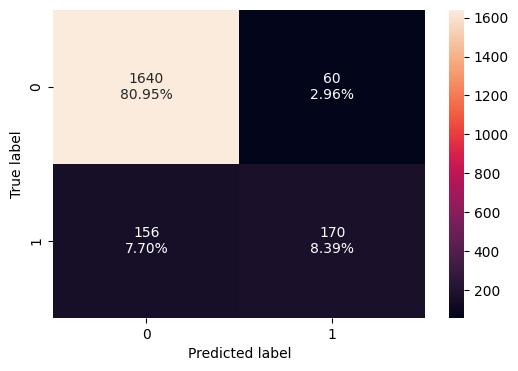

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(lr, X_val, y_val)

* Performance on the training set improved but the model is not able to replicate the same for the validation set.

* Model is overfitting

**5.1.2** **Model 2 Bagging Classifier**

In [ ]:
bagging = BaggingClassifier(random_state=1)
bagging.fit(X_train,y_train)

BaggingClassifier(random_state=1)

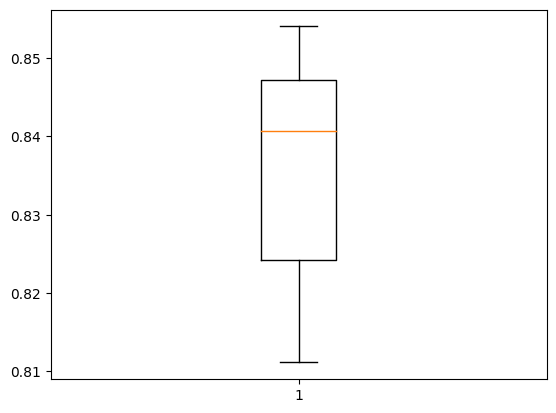

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=bagging, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
bagging_train_perf = model_performance_classification_sklearn(
    bagging, X_train, y_train
)
print("Training performance:")
bagging_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.996708,0.985656,0.993802,0.989712


Bagging shows high Accuracy, Recall and F1 score on training data set

In [ ]:
bagging_val_perf = model_performance_classification_sklearn(
    bagging, X_val, y_val
)
print("Validation performance:")
bagging_val_perf

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.955577,0.819018,0.895973,0.855769


Accuracy, Recall , Precision and F1 Score decreased but model is given similiar outputs at validation set

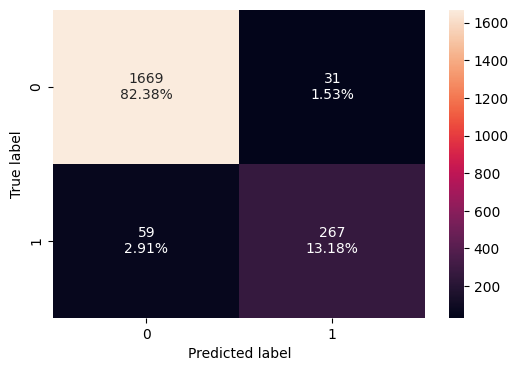

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(bagging, X_val, y_val)

**5.1.3** **Model 3 Decision Tree Classifier**

In [ ]:
dtree = DecisionTreeClassifier(criterion='gini',random_state=1)

In [ ]:
dtree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

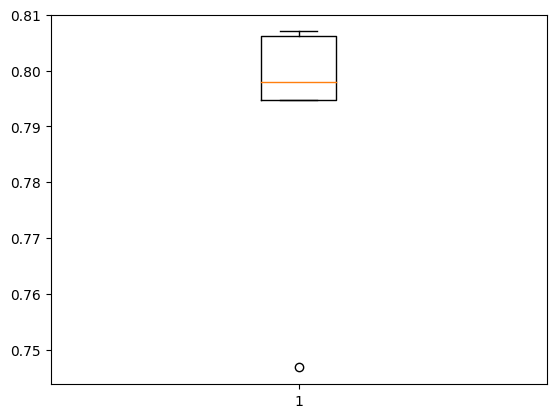

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=dtree, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
dtree_train_perf = model_performance_classification_sklearn(
    dtree, X_train, y_train
)
print("Decision Tree Training performance:")

dtree_train_perf

Decision Tree Training performance:


,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Decision Tree is overfitted

In [ ]:
dtree_val_perf = model_performance_classification_sklearn(
    dtree, X_val, y_val
)
print("Decision trree Validation performance:")
dtree_val_perf

Decision trree Validation performance:


,Accuracy,Recall,Precision,F1
0,0.936821,0.800613,0.805556,0.803077


Accuracy , Recall ,Precision, F1 decreased but model shows more generalized view

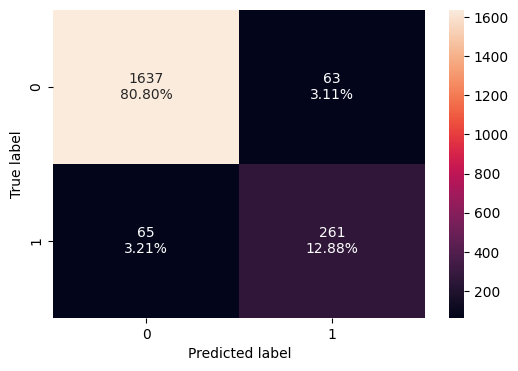

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(dtree, X_val, y_val)

**5.1.4** **Model 4 Random Forest Classifier**

In [ ]:
randomforest = RandomForestClassifier(random_state=1)
randomforest.fit(X_train,y_train)

RandomForestClassifier(random_state=1)

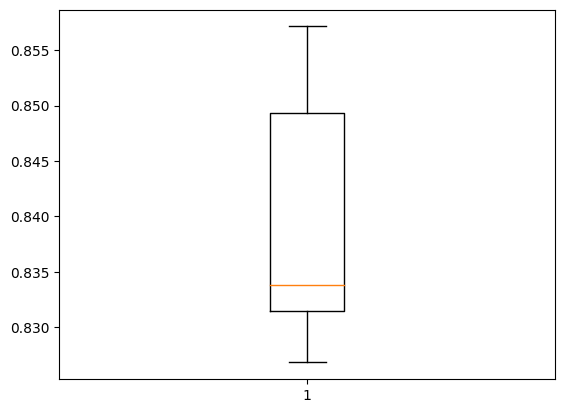

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=randomforest, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
randomforest_train_perf = model_performance_classification_sklearn(
    randomforest, X_train, y_train
)
print("Random Forest Training performance:")

randomforest_train_perf

Random Forest Training performance:


,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Model seems overfitted 

In [ ]:
randomforest_val_perf = model_performance_classification_sklearn(
    randomforest, X_val, y_val
)
print("Random Forest Validation performance:")
randomforest_val_perf

Random Forest Validation performance:


,Accuracy,Recall,Precision,F1
0,0.961007,0.828221,0.921502,0.872375


There are significant decrease on Recall and F1 ; but Precision seems good.

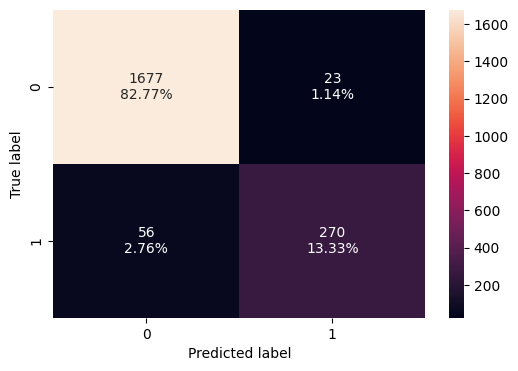

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(randomforest, X_val, y_val)

**5.1.5** **Model 5 Gradient Boosting Classifier**

In [ ]:
gbc = GradientBoostingClassifier(random_state=1)
gbc.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

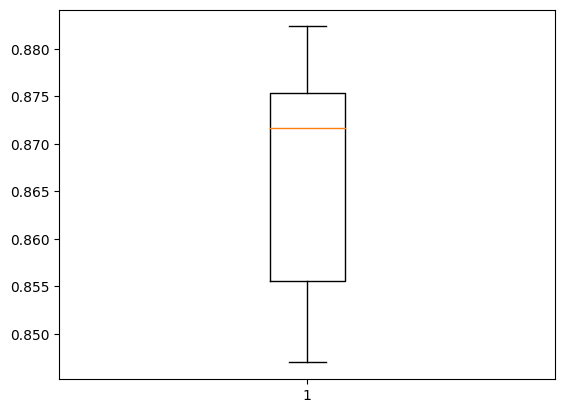

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=gbc, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
gbc_train_perf = model_performance_classification_sklearn(
    gbc, X_train, y_train)

In [ ]:
gbc_train_perf

,Accuracy,Recall,Precision,F1
0,0.973004,0.879098,0.949115,0.912766


In [ ]:
gbc_val_perf = model_performance_classification_sklearn(
    gbc, X_val, y_val)
print("Gbc Validation performance:")
gbc_val_perf

Gbc Validation performance:


,Accuracy,Recall,Precision,F1
0,0.969398,0.858896,0.945946,0.900322


Training and Validation scores seems near to each other . Values slightly decrease at validation set

**5.1.6** **Model 6 XGBoost Classifier**

In [ ]:
xgb = XGBClassifier(random_state=1,eval_metric='logloss')
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

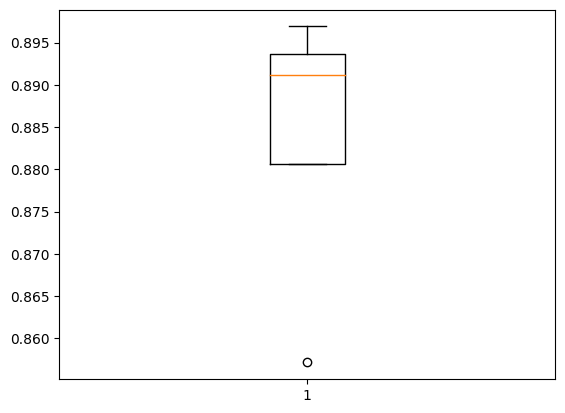

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=xgb, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
xgb_train_perf = model_performance_classification_sklearn(
    xgb, X_train, y_train)

In [ ]:
xgb_train_perf

,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Training data seems overfitted

In [ ]:
xgb_val_perf = model_performance_classification_sklearn(
    xgb, X_val, y_val)
print("XGB Validation performance:")
xgb_val_perf

XGB Validation performance:


,Accuracy,Recall,Precision,F1
0,0.971372,0.892638,0.926752,0.909375


Model seems more generalized and scores decreased compaired to training set

In [ ]:
models_train_comp_df = pd.concat(
    [
        log_reg_model_train_perf.T,
        bagging_train_perf.T,
        dtree_train_perf.T,
        randomforest_train_perf.T,
        gbc_train_perf.T,
        xgb_train_perf.T,

    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression Training Perfomance",
    "Bagging Classifier Training Performance",
    "Decision Tree Training Performance",
    "Random Forest Training Performance",
    "GBC Training Performance",
    "XGB Training Performance",


]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression Training Perfomance,Bagging Classifier Training Performance,Decision Tree Training Performance,Random Forest Training Performance,GBC Training Performance,XGB Training Performance
Accuracy,0.884444,0.996708,1.0,1.0,0.973004,1.0
Recall,0.472336,0.985656,1.0,1.0,0.879098,1.0
Precision,0.711420,0.993802,1.0,1.0,0.949115,1.0
F1,0.567734,0.989712,1.0,1.0,0.912766,1.0


XGB , GBC anf Random Forest gave highest validation results on training set

In [ ]:
models_Validation_comp_df_val = pd.concat(
    [
        log_reg_model_val_perf.T,
        bagging_val_perf.T,
        dtree_val_perf.T,
        randomforest_val_perf.T,
        gbc_val_perf.T,
        xgb_val_perf.T,

    ],
    axis=1,
)
models_Validation_comp_df_val.columns = [
    "Logistic Regression Validation Set Perfomance",
    "Bagging Classifier Validation Set Performance",
    "Decision Tree Validation Set Performance",
    "Random Forest Validation Set Performance",
    "GBC Validation Set Performance",
    "XGB Validation Set Performance",


]
print("Validation performance comparison:")
models_Validation_comp_df_val

Validation performance comparison:


,Logistic Regression Validation Set Perfomance,Bagging Classifier Validation Set Performance,Decision Tree Validation Set Performance,Random Forest Validation Set Performance,GBC Validation Set Performance,XGB Validation Set Performance
Accuracy,0.893386,0.955577,0.936821,0.961007,0.969398,0.971372
Recall,0.521472,0.819018,0.800613,0.828221,0.858896,0.892638
Precision,0.739130,0.895973,0.805556,0.921502,0.945946,0.926752
F1,0.611511,0.855769,0.803077,0.872375,0.900322,0.909375


XGB , GBC anf Random Forest gave highest validation results on Vaidation set

**5.2** **Oversampling Data Modelling**

In [ ]:
print("Before Oversampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  # Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After Oversampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before Oversampling, counts of label 'Yes': 976
Before Oversampling, counts of label 'No': 5099 

After Oversampling, counts of label 'Yes': 5099
After Oversampling, counts of label 'No': 5099 

After Oversampling, the shape of train_X: (10198, 25)
After Oversampling, the shape of train_y: (10198,) 



**5.2.1** **Model 1 Logistic Over Regression Over Sampled Data**

In [ ]:
lr_over = LogisticRegression(random_state=1)
lr_over.fit(X_train_over, y_train_over)

LogisticRegression(random_state=1)

**Let's evaluate the model performance by using KFold and cross_val_score**

- `K-Folds cross-validation` provides dataset indices to split data into train/validation sets. Split dataset into k consecutive stratified folds (without shuffling by default). Each fold is then used once as validation while the k - 1 remaining folds form the training set.

- `Stratified K-fold` is a variation of KFold that returns stratified folds. The folds are made by preserving the percentage of samples for each class.

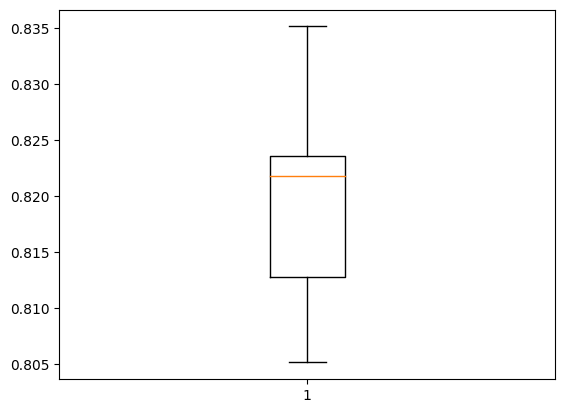

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=lr_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
# Calculating different metrics on train set
log_reg_model_train_perf_over = model_performance_classification_sklearn(
    lr_over, X_train_over, y_train_over)
print("Training performance:")
log_reg_model_train_perf_over

Training performance:


,Accuracy,Recall,Precision,F1
0,0.819376,0.824672,0.816029,0.820328


In [ ]:
# Calculating different metrics on validation set
log_reg_model_val_perf_over = model_performance_classification_sklearn(lr_over, X_val, y_val)
print("Validation Over Sample performance:")
log_reg_model_val_perf_over

Validation Over Sample performance:


,Accuracy,Recall,Precision,F1
0,0.813919,0.794479,0.455185,0.578771


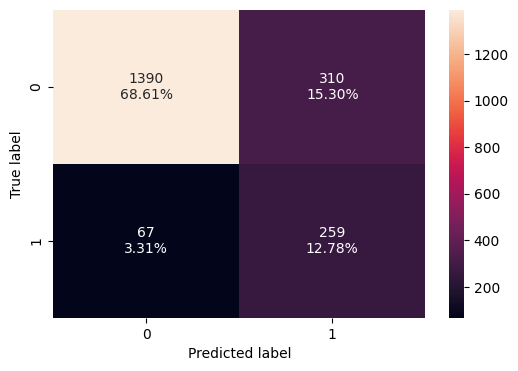

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(lr_over, X_val, y_val)

*Model not performs well on training and validation over sampled data 

* Model is overfitting

**5.2.2** **Model 2 Bagging Classifier Over Sampled Data**

In [ ]:
bagging_over = BaggingClassifier(random_state=1)
bagging_over.fit(X_train_over,y_train_over)

BaggingClassifier(random_state=1)

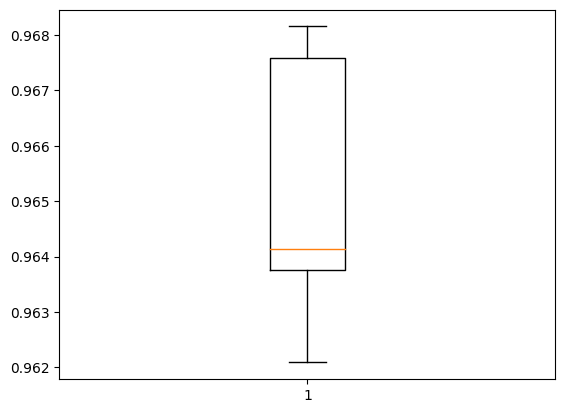

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=bagging_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
bagging_train_perf_over = model_performance_classification_sklearn(
    bagging_over, X_train_over, y_train_over
)
print("Training performance on over sampled data:")
bagging_train_perf

Training performance on over sampled data:


,Accuracy,Recall,Precision,F1
0,0.996708,0.985656,0.993802,0.989712


Bagging on oversampled data shows high Accuracy, Recall and F1 score on training data set

In [ ]:
bagging_val_perf_over = model_performance_classification_sklearn(
    bagging_over, X_val, y_val
)
print("Validation performance:")
bagging_val_perf_over

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.944225,0.834356,0.821752,0.828006


Accuracy, Recall , Precision and F1 Score decreased but model is given similiar outputs at validation set

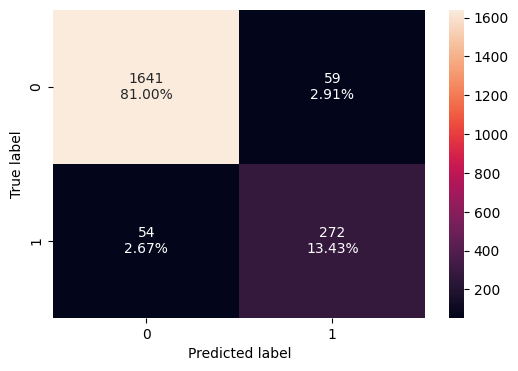

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(bagging_over, X_val, y_val)

**5.2.3** **Model 3 Decision Tree Classifier Over Sampled Data**

In [ ]:
dtree_over = DecisionTreeClassifier(criterion='gini',random_state=1)

In [ ]:
dtree_over.fit(X_train_over, y_train_over)

DecisionTreeClassifier(random_state=1)

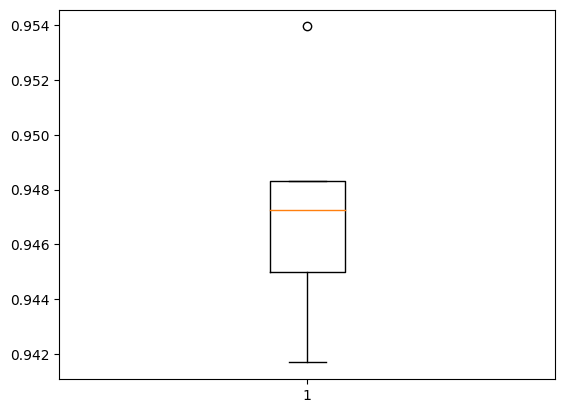

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=dtree_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
dtree_train_perf_over = model_performance_classification_sklearn(
    dtree_over, X_train_over, y_train_over
)
print("Decision Tree Over Sampled Data Training performance:")

dtree_train_perf_over

Decision Tree Over Sampled Data Training performance:


,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Decision Tree is overfitted

In [ ]:
dtree_val_perf_over = model_performance_classification_sklearn(
    dtree_over, X_val, y_val
)
print("Decision trree Validation performance:")
dtree_val_perf

Decision trree Validation performance:


,Accuracy,Recall,Precision,F1
0,0.936821,0.800613,0.805556,0.803077


Accuracy , Recall ,Precision, F1 decreased but model shows more generalized view

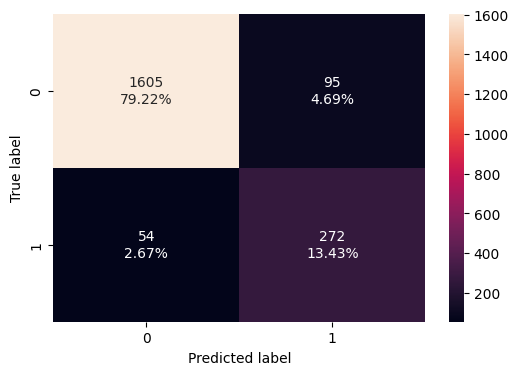

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(dtree_over, X_val, y_val)

**5.2.4** **Model 4 Random Forest Classifier With Oversampled Data**

In [ ]:
randomforest_over = RandomForestClassifier(random_state=1)
randomforest_over.fit(X_train_over,y_train_over)

RandomForestClassifier(random_state=1)

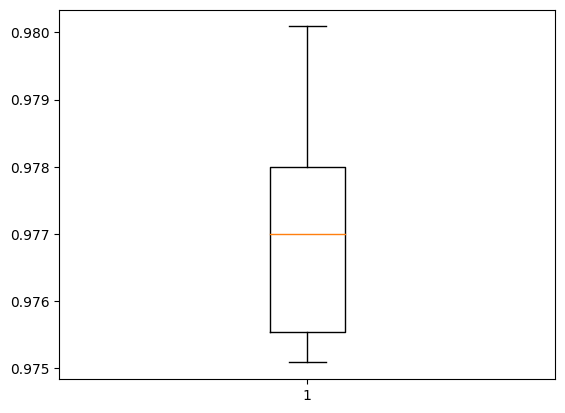

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=randomforest_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
randomforest_train_perf_over = model_performance_classification_sklearn(
    randomforest_over, X_train_over, y_train_over)
print("Random Forest Training performance on over sampled data:")

randomforest_train_perf_over

Random Forest Training performance on over sampled data:


,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Model seems overfitted 

In [ ]:
randomforest_val_perf_over = model_performance_classification_sklearn(
    randomforest_over, X_val, y_val
)
print("Random Forest Validation performance:")
randomforest_val_perf_over

Random Forest Validation performance:


,Accuracy,Recall,Precision,F1
0,0.956565,0.852761,0.874214,0.863354


Model seems genealized view rather than training set.

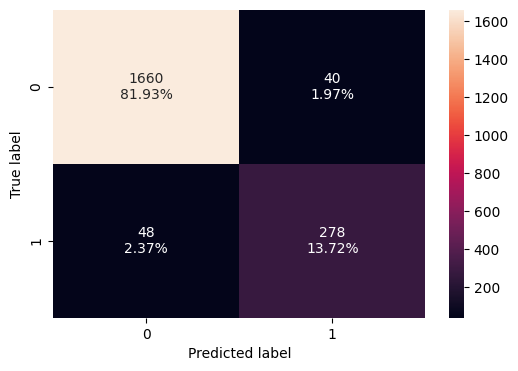

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(randomforest_over, X_val, y_val)

**5.2.5** **Model 5 Gradient Boosting Classifier Over Sample Data**

In [ ]:
gbc_over = GradientBoostingClassifier(random_state=1)
gbc_over.fit(X_train_over,y_train_over)

GradientBoostingClassifier(random_state=1)

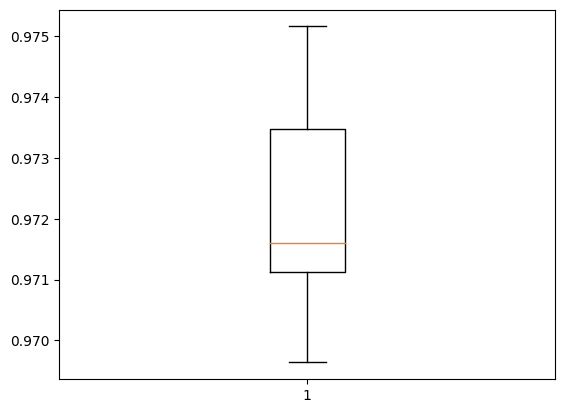

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=gbc_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
gbc_train_perf_over = model_performance_classification_sklearn(
    gbc_over, X_train_over, y_train_over)

In [ ]:
gbc_train_perf_over

,Accuracy,Recall,Precision,F1
0,0.979015,0.981173,0.976958,0.979061


In [ ]:
gbc_val_perf_over = model_performance_classification_sklearn(
    gbc_over, X_val, y_val)
print("Gbc Validation performance:")
gbc_val_perf_over

Gbc Validation performance:


,Accuracy,Recall,Precision,F1
0,0.956071,0.877301,0.853731,0.865356


Accuracy of the data not changed to much but the other values decreased on validation set

**5.2.6** **Model 6 XGBoost Classifier On Over Sampled Data**

In [ ]:
xgb_over = XGBClassifier(random_state=1,eval_metric='logloss')
xgb_over.fit(X_train_over, y_train_over)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

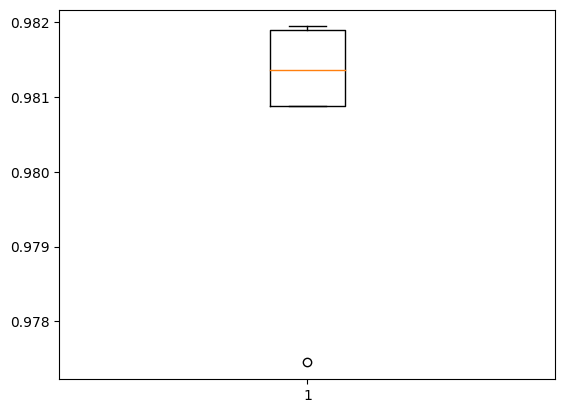

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=xgb_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
xgb_train_perf_over = model_performance_classification_sklearn(
    xgb_over, X_train_over, y_train_over)

In [ ]:
xgb_train_perf_over

,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Training data seems overfitted

In [ ]:
xgb_val_perf_over = model_performance_classification_sklearn(
    xgb_over, X_val, y_val)
print("XGB Validation performance:")
xgb_val_perf_over

XGB Validation performance:


,Accuracy,Recall,Precision,F1
0,0.970385,0.898773,0.915625,0.907121


Model seems more generalized and scores decreased compaired to training set

In [ ]:
models_train_comp_df_over = pd.concat(
    [
        log_reg_model_train_perf_over.T,
        bagging_train_perf_over.T,
        dtree_train_perf_over.T,
        randomforest_train_perf_over.T,
        gbc_train_perf_over.T,
        xgb_train_perf_over.T,

    ],
    axis=1,
)
models_train_comp_df_over.columns = [
    "LR Training Perfomance Over Sample",
    "BC Training Performance Over Sample",
    "DT Training Performance Over Sample",
    "RF Training Performance Over Sample",
    "GBC Training Performance Over Sample",
    "XGB Training Performance Over Sample",


]
print("Training performance comparison On Over Sample Data")
models_train_comp_df_over

Training performance comparison On Over Sample Data


,LR Training Perfomance Over Sample,BC Training Performance Over Sample,DT Training Performance Over Sample,RF Training Performance Over Sample,GBC Training Performance Over Sample,XGB Training Performance Over Sample
Accuracy,0.819376,0.998235,1.0,1.0,0.979015,1.0
Recall,0.824672,0.997843,1.0,1.0,0.981173,1.0
Precision,0.816029,0.998626,1.0,1.0,0.976958,1.0
F1,0.820328,0.998234,1.0,1.0,0.979061,1.0


In [ ]:
models_Validation_comp_df_over = pd.concat(
    [
        log_reg_model_val_perf_over.T,
        bagging_val_perf_over.T,
        dtree_val_perf_over.T,
        randomforest_val_perf_over.T,
        gbc_val_perf_over.T,
        xgb_val_perf_over.T,

    ],
    axis=1,
)
models_Validation_comp_df_over.columns = [
    "LR Validation Over Sample Set Perfomance",
    "BC Validation Over Sample Set Performance",
    "DT Validation Over Sample Set Performance",
    "RF Validation Over Sample Set Performance",
    "GBC Validation Over Sample Set Performance",
    "XGB Validation Over Sample Set Performance",

]
print("Validation performance comparison:")
models_Validation_comp_df_over

Validation performance comparison:


,LR Validation Over Sample Set Perfomance,BC Validation Over Sample Set Performance,DT Validation Over Sample Set Performance,RF Validation Over Sample Set Performance,GBC Validation Over Sample Set Performance,XGB Validation Over Sample Set Performance
Accuracy,0.813919,0.944225,0.926456,0.956565,0.956071,0.970385
Recall,0.794479,0.834356,0.834356,0.852761,0.877301,0.898773
Precision,0.455185,0.821752,0.741144,0.874214,0.853731,0.915625
F1,0.578771,0.828006,0.784993,0.863354,0.865356,0.907121


`XGB , GBC anf Random Forest gave highest validation results on Validation set`

**5.3** **Under Sampling Data Modelling**

Using Random Under Sampler

In [ ]:
rus = RandomUnderSampler(random_state=1)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)

In [ ]:
print("Before Undersampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Undersampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Undersampling, counts of label 'Yes': {}".format(sum(y_train_under == 1)))
print("After Undersampling, counts of label 'No': {} \n".format(sum(y_train_under == 0)))

print("After Undersampling, the shape of train_X: {}".format(X_train_under.shape))
print("After Undersampling, the shape of train_y: {} \n".format(y_train_under.shape))

Before Undersampling, counts of label 'Yes': 976
Before Undersampling, counts of label 'No': 5099 

After Undersampling, counts of label 'Yes': 976
After Undersampling, counts of label 'No': 976 

After Undersampling, the shape of train_X: (1952, 25)
After Undersampling, the shape of train_y: (1952,) 



**5.3.1** **Model 1 Logistic Regression Under Sampled Data**

In [ ]:
lr_under = LogisticRegression(random_state=1)
lr_under.fit(X_train_under, y_train_under)

LogisticRegression(random_state=1)

**Let's evaluate the model performance by using KFold and cross_val_score**

- `K-Folds cross-validation` provides dataset indices to split data into train/validation sets. Split dataset into k consecutive stratified folds (without shuffling by default). Each fold is then used once as validation while the k - 1 remaining folds form the training set.

- `Stratified K-fold` is a variation of KFold that returns stratified folds. The folds are made by preserving the percentage of samples for each class.

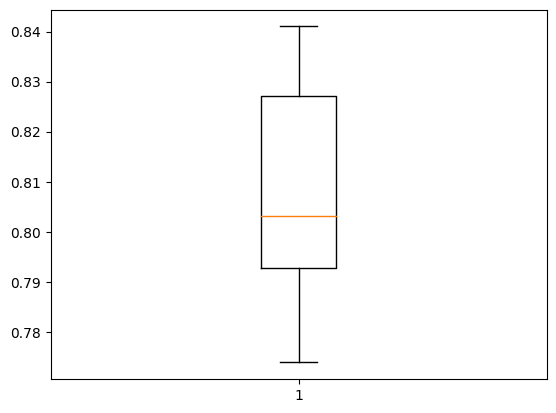

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=lr_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
# Calculating different metrics on train set
log_reg_model_train_perf_under = model_performance_classification_sklearn(
    lr_under, X_train_under, y_train_under)
print("Training performance:")
log_reg_model_train_perf_under

Training performance:


,Accuracy,Recall,Precision,F1
0,0.810451,0.808402,0.811728,0.810062


In [ ]:
# Calculating different metrics on validation set
log_reg_model_val_perf_under = model_performance_classification_sklearn(lr_under, X_val, y_val)
print("Validation under Sample performance:")
log_reg_model_val_perf_under

Validation under Sample performance:


,Accuracy,Recall,Precision,F1
0,0.804047,0.809816,0.440735,0.570811


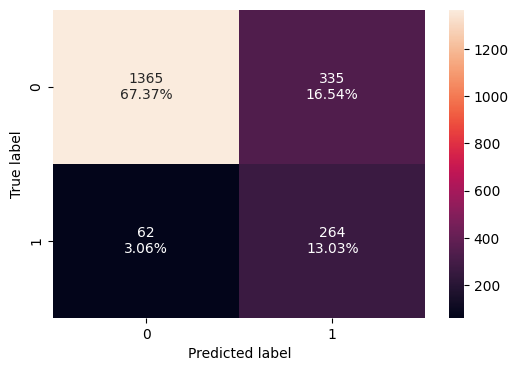

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(lr_under, X_val, y_val)

*Model not performs well on training and validation under sampled data 

**5.3.2** **Model 2 Bagging Classifier under Sampled Data**

In [ ]:
bagging_under = BaggingClassifier(random_state=1)
bagging_under.fit(X_train_under,y_train_under)

BaggingClassifier(random_state=1)

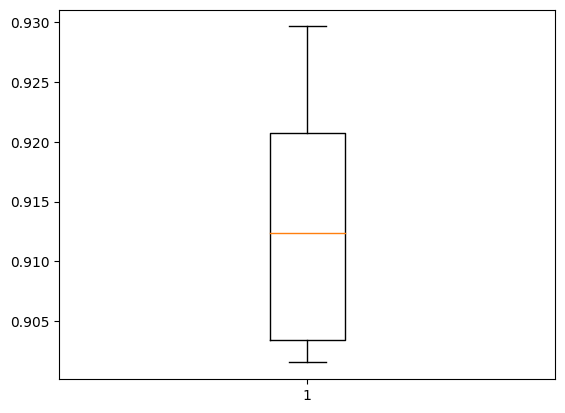

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=bagging_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
bagging_train_perf_under = model_performance_classification_sklearn(
    bagging_over, X_train_under, y_train_under
)
print("Training performance on under sampled data:")
bagging_train_perf_under

Training performance on under sampled data:


,Accuracy,Recall,Precision,F1
0,0.996926,0.995902,0.997947,0.996923


Bagging on oversampled data shows high Accuracy, Recall and F1 score on training data set

In [ ]:
bagging_val_perf_under = model_performance_classification_sklearn(
    bagging_under, X_val, y_val
)
print("Validation performance:")
bagging_val_perf_under

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.924975,0.917178,0.705189,0.797333


Accuracy, Recall , Precision and F1 Score decreased but model is given similiar outputs at validation set

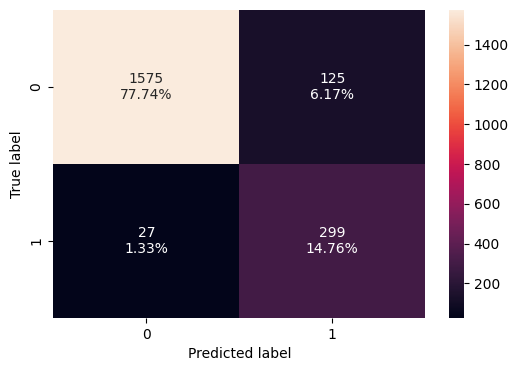

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(bagging_under, X_val, y_val)

**5.3.3** **Model 3 Decision Tree Classifier Under Sampled Data**

In [ ]:
dtree_under = DecisionTreeClassifier(criterion='gini',random_state=1)

In [ ]:
dtree_under.fit(X_train_under, y_train_under)

DecisionTreeClassifier(random_state=1)

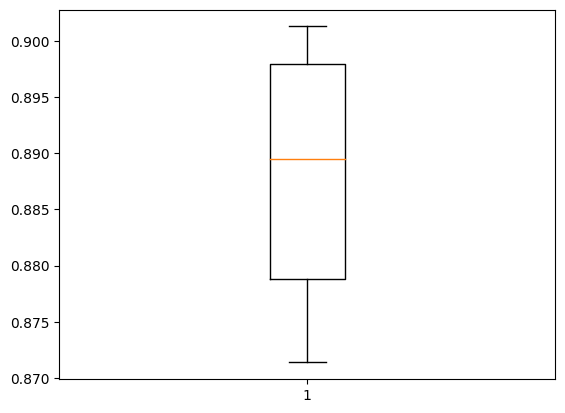

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=dtree_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
dtree_train_perf_under = model_performance_classification_sklearn(
    dtree_under, X_train_under, y_train_under
)
print("Decision Tree Under Sampled Data Training performance:")

dtree_train_perf_under

Decision Tree Under Sampled Data Training performance:


,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Decision Tree is overfitted

In [ ]:
dtree_val_perf_under = model_performance_classification_sklearn(
    dtree_under, X_val, y_val
)
print("Decision tree Validation performance:")
dtree_val_perf_under

Decision tree Validation performance:


,Accuracy,Recall,Precision,F1
0,0.892892,0.92638,0.610101,0.735688


Accuracy , Recall ,Precision, F1 decreased but model shows more generalized view

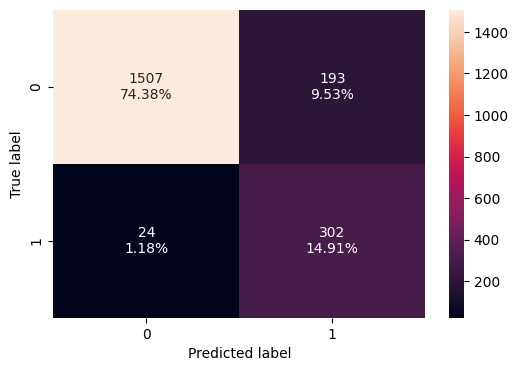

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(dtree_under, X_val, y_val)

**5.3.4** **Model 4 Random Forest Classifier With Under Sampled Data**

In [ ]:
randomforest_under = RandomForestClassifier(random_state=1)
randomforest_under.fit(X_train_under,y_train_under)

RandomForestClassifier(random_state=1)

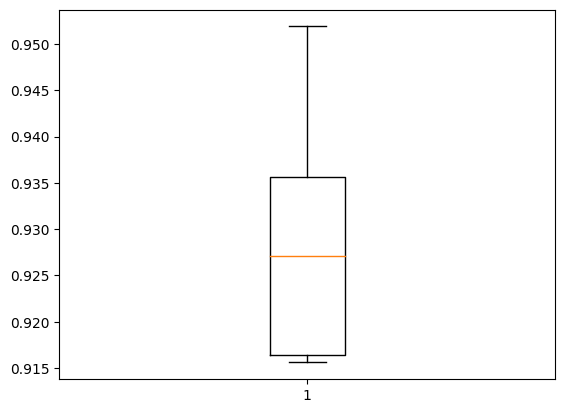

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=randomforest_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
randomforest_train_perf_under = model_performance_classification_sklearn(
    randomforest_under, X_train_under, y_train_under)
print("Random Forest Training performance on under sampled data:")

randomforest_train_perf_under

Random Forest Training performance on under sampled data:


,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Model seems overfitted 

In [ ]:
randomforest_val_perf_under = model_performance_classification_sklearn(
    randomforest_under, X_val, y_val
)
print("Random Forest Validation performance:")
randomforest_val_perf_under

Random Forest Validation performance:


,Accuracy,Recall,Precision,F1
0,0.93386,0.941718,0.727488,0.820856


Model seems genealized view rather than training set.

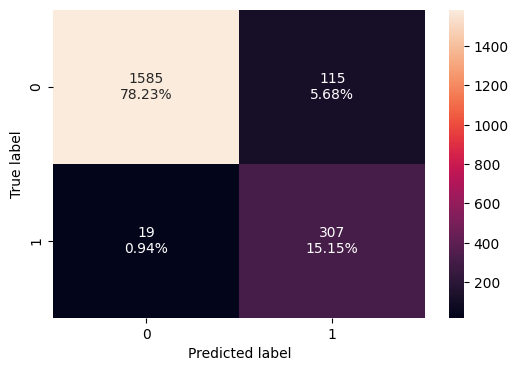

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(randomforest_under, X_val, y_val)

**5.3.5** **Model 5 Gradient Boosting Classifier Under Sample Data**

In [ ]:
gbc_under = GradientBoostingClassifier(random_state=1)
gbc_under.fit(X_train_under,y_train_under)

GradientBoostingClassifier(random_state=1)

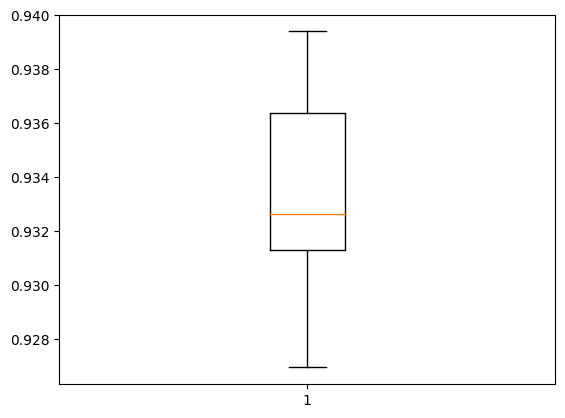

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=gbc_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
gbc_train_perf_under = model_performance_classification_sklearn(
    gbc_under, X_train_under, y_train_under)

In [ ]:
gbc_train_perf_under

,Accuracy,Recall,Precision,F1
0,0.974385,0.980533,0.968623,0.974542


In [ ]:
gbc_val_perf_under = model_performance_classification_sklearn(
    gbc_under, X_val, y_val)
print("Gbc Validation performance:")
gbc_val_perf_under

Gbc Validation performance:


,Accuracy,Recall,Precision,F1
0,0.936328,0.957055,0.730679,0.828685


Values decreased on validation set model shows high Recall performance

**5.3.6** **Model 6 XGBoost Classifier On Over Sampled Data**

In [ ]:
xgb_under = XGBClassifier(random_state=1,eval_metric='logloss')
xgb_under.fit(X_train_under, y_train_under)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

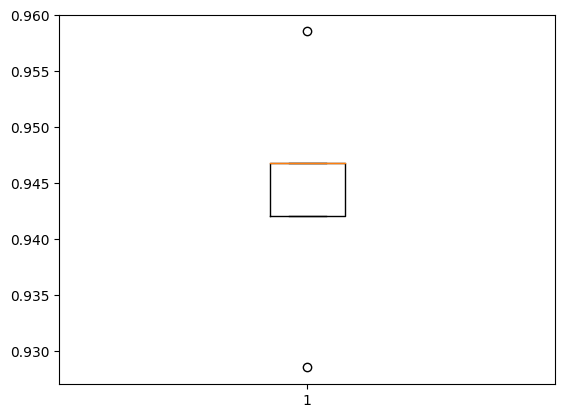

In [ ]:
scoring = "f1"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=xgb_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

In [ ]:
xgb_train_perf_under = model_performance_classification_sklearn(
    xgb_under, X_train_under, y_train_under)

In [ ]:
xgb_train_perf_under

,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


Training data seems overfitted

In [ ]:
xgb_val_perf_under = model_performance_classification_sklearn(
    xgb_under, X_val, y_val)
print("XGB Validation performance:")
xgb_val_perf_under

XGB Validation performance:


,Accuracy,Recall,Precision,F1
0,0.939289,0.957055,0.741093,0.835341


Model seems more generalized and scores decreased compaired to training set

In [ ]:
models_train_comp_df_under = pd.concat(
    [
        log_reg_model_train_perf_under.T,
        bagging_train_perf_under.T,
        dtree_train_perf_under.T,
        randomforest_train_perf_under.T,
        gbc_train_perf_under.T,
        xgb_train_perf_under.T,

    ],
    axis=1,
)
models_train_comp_df_under.columns = [
    "LR Training Perfomance under Sample",
    "BC Training Performance under Sample",
    "DT Training Performance under Sample",
    "RF Training Performance under Sample",
    "GBC Training Performance under Sample",
    "XGB Training Performance under Sample",


]
print("Training performance comparison On under Sample Data")
models_train_comp_df_under

Training performance comparison On under Sample Data


,LR Training Perfomance under Sample,BC Training Performance under Sample,DT Training Performance under Sample,RF Training Performance under Sample,GBC Training Performance under Sample,XGB Training Performance under Sample
Accuracy,0.810451,0.996926,1.0,1.0,0.974385,1.0
Recall,0.808402,0.995902,1.0,1.0,0.980533,1.0
Precision,0.811728,0.997947,1.0,1.0,0.968623,1.0
F1,0.810062,0.996923,1.0,1.0,0.974542,1.0


In [ ]:
models_Validation_comp_df_under = pd.concat(
    [
        log_reg_model_val_perf_under.T,
        bagging_val_perf_under.T,
        dtree_val_perf_under.T,
        randomforest_val_perf_under.T,
        gbc_val_perf_under.T,
        xgb_val_perf_under.T,

    ],
    axis=1,
)
models_Validation_comp_df_under.columns = [
    "LR Validation under Sample Set Perfomance",
    "BC Validation under Sample Set Performance",
    "DT Validation under Sample Set Performance",
    "RF Validation under Sample Set Performance",
    "GBC Validation under Sample Set Performance",
    "XGB Validation under Sample Set Performance",

]
print("Validation performance comparison:")
models_Validation_comp_df_under

Validation performance comparison:


,LR Validation under Sample Set Perfomance,BC Validation under Sample Set Performance,DT Validation under Sample Set Performance,RF Validation under Sample Set Performance,GBC Validation under Sample Set Performance,XGB Validation under Sample Set Performance
Accuracy,0.804047,0.924975,0.892892,0.933860,0.936328,0.939289
Recall,0.809816,0.917178,0.926380,0.941718,0.957055,0.957055
Precision,0.440735,0.705189,0.610101,0.727488,0.730679,0.741093
F1,0.570811,0.797333,0.735688,0.820856,0.828685,0.835341


`XGB , GBC anf Random Forest gave highest validation results on Validation set`

**Comparision Of All Validation Set Results**

6 Models with normal training set

In [ ]:
models_Validation_comp_df_val

,Logistic Regression Validation Set Perfomance,Bagging Classifier Validation Set Performance,Decision Tree Validation Set Performance,Random Forest Validation Set Performance,GBC Validation Set Performance,XGB Validation Set Performance
Accuracy,0.893386,0.955577,0.936821,0.961007,0.969398,0.971372
Recall,0.521472,0.819018,0.800613,0.828221,0.858896,0.892638
Precision,0.739130,0.895973,0.805556,0.921502,0.945946,0.926752
F1,0.611511,0.855769,0.803077,0.872375,0.900322,0.909375


6 Models with Under sampling data

In [ ]:
models_Validation_comp_df_under

,LR Validation under Sample Set Perfomance,BC Validation under Sample Set Performance,DT Validation under Sample Set Performance,RF Validation under Sample Set Performance,GBC Validation under Sample Set Performance,XGB Validation under Sample Set Performance
Accuracy,0.804047,0.924975,0.892892,0.933860,0.936328,0.939289
Recall,0.809816,0.917178,0.926380,0.941718,0.957055,0.957055
Precision,0.440735,0.705189,0.610101,0.727488,0.730679,0.741093
F1,0.570811,0.797333,0.735688,0.820856,0.828685,0.835341


6 Models with over sampling data

In [ ]:
models_Validation_comp_df_over

,LR Validation Over Sample Set Perfomance,BC Validation Over Sample Set Performance,DT Validation Over Sample Set Performance,RF Validation Over Sample Set Performance,GBC Validation Over Sample Set Performance,XGB Validation Over Sample Set Performance
Accuracy,0.813919,0.944225,0.926456,0.956565,0.956071,0.970385
Recall,0.794479,0.834356,0.834356,0.852761,0.877301,0.898773
Precision,0.455185,0.821752,0.741144,0.874214,0.853731,0.915625
F1,0.578771,0.828006,0.784993,0.863354,0.865356,0.907121


***Random Forest , Gradient Boosting Classifier and XGBoost Classifier gives best perfromance for F1 score ***

**5.4** **Hyperparameter Tuning**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [ ]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

**5.4.1** **Random Forest Tuning**

In [ ]:


# defining model
model = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Parameter grid to pass in GridSearchCV

parameters = {
    "n_estimators": [10,50,75],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=parameters, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.8, 'n_estimators': 75, 'max_features': 0.8} with CV score=0.8559784951020915:


In [ ]:
RandomForestClassifier_tuned=RandomForestClassifier(
        n_estimators=75,        
        max_features=0.8,
        max_samples=0.8)



In [ ]:
RandomForestClassifier_tuned.fit(X_train,y_train)

RandomForestClassifier(max_features=0.8, max_samples=0.8, n_estimators=75)

In [ ]:
RandomForest_Tuned_Train_Random = model_performance_classification_sklearn(
    RandomForestClassifier_tuned, X_train, y_train
)
print("Training performance:")
print(RandomForest_Tuned_Train_Random)

Training performance:
   Accuracy  Recall  Precision        F1
0  0.999671     1.0   0.997955  0.998976


**Check On Validation Set**

In [ ]:
RandomForest_Tuned_Val_Random = model_performance_classification_sklearn(
    RandomForestClassifier_tuned, X_val, y_val
)
print("Validation performance:")
print(RandomForest_Tuned_Val_Random)

Validation performance:
   Accuracy    Recall  Precision      F1
0  0.964462  0.871166   0.904459  0.8875


**5.4.2** **Gradient Boosting Classifier**

In [ ]:


# defining model
model = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Parameter grid to pass in GridSearchCV

parameters = {
    "n_estimators": [100,150],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,1]
}


# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=parameters, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.8, 'n_estimators': 150, 'max_features': 0.8} with CV score=0.8844320669270582:


In [ ]:
GradientBoostingClassifier_tuned=GradientBoostingClassifier(
        n_estimators=150,        
        subsample=0.8,
        max_features=0.8)



In [ ]:
GradientBoostingClassifier_tuned.fit(X_train,y_train)

GradientBoostingClassifier(max_features=0.8, n_estimators=150, subsample=0.8)

In [ ]:
GradientBoostingClassifier_tuned_Random = model_performance_classification_sklearn(
    GradientBoostingClassifier_tuned, X_train, y_train
)
print("Training performance:")
print(GradientBoostingClassifier_tuned_Random)

Training performance:
   Accuracy    Recall  Precision        F1
0  0.981564  0.918033   0.965517  0.941176


**Check On Validation Set**

In [ ]:
GradientBoostingClassifier_tuned_Val_Random = model_performance_classification_sklearn(
    GradientBoostingClassifier_tuned, X_val, y_val
)
print("Validation performance:")
print(GradientBoostingClassifier_tuned_Val_Random)

Validation performance:
   Accuracy    Recall  Precision        F1
0  0.970879  0.877301   0.937705  0.906498


**5.4.3** **XGBoost Tuning**

In [ ]:


# defining model
model = XGBClassifier(random_state=1,eval_metric='logloss')

# Parameter grid to pass in GridSearchCV

parameters = {
    "n_estimators": np.arange(10,20,30),
    "scale_pos_weight":[0,1,2,5],
    "subsample":[0.5,0.7,0.9,1],
    "learning_rate":[0.1,0.05],
    "gamma":[0,3],
    "colsample_bytree":[0.5,0.9,1],
    "colsample_bylevel":[0.5,0.9,1]
}


# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=parameters, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 1, 'scale_pos_weight': 2, 'n_estimators': 10, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.9, 'colsample_bylevel': 0.9} with CV score=0.8410657889265591:


In [ ]:
xgb_tuned1 = XGBClassifier(
    subsample=1,
    n_estimators=10,
    scale_pos_weight=2,    
    learning_rate=0.1,
    gamma=0,    
    colsample_bytree=0.9,
    colsample_bylevel=0.9,
)

# Fit the model on training data
xgb_tuned1.fit(X_train, y_train)



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.9, colsample_bynode=None,
              colsample_bytree=0.9, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=10, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [ ]:
XGB_Train_tuned_Random = model_performance_classification_sklearn(
    xgb_tuned1, X_train, y_train
)
print("Training performance:")
print(XGB_Train_tuned_Random)

Training performance:
   Accuracy    Recall  Precision        F1
0  0.965267  0.923156   0.868852  0.895181


**Check On Validation Set**

In [ ]:
XGB_tuned_Val_Random = model_performance_classification_sklearn(
    xgb_tuned1, X_val, y_val
)
print("Validation performance:")
print(XGB_tuned_Val_Random)

Validation performance:
   Accuracy    Recall  Precision        F1
0  0.948667  0.883436   0.813559  0.847059


**Comparing Tunings On Training Set**

In [ ]:
# training performance comparison

models_train_comp_random_srch_df = pd.concat(
    [
        RandomForest_Tuned_Train_Random.T,
        GradientBoostingClassifier_tuned_Random.T,
        XGB_Train_tuned_Random.T,       
    ],
    axis=1,
)
models_train_comp_random_srch_df.columns = [
    "RFTuned with Random search",
    "GBTuned with Random search",
    "XgbTuned with Random Search",
    
]
print("Training performance comparison:")
models_train_comp_random_srch_df

Training performance comparison:


,RFTuned with Random search,GBTuned with Random search,XgbTuned with Random Search
Accuracy,0.999671,0.981564,0.965267
Recall,1.000000,0.918033,0.923156
Precision,0.997955,0.965517,0.868852
F1,0.998976,0.941176,0.895181


**Tuned models comparision on Validation Set**

In [ ]:
# training performance comparison

models_val_comp_random_srch_df = pd.concat(
    [
        RandomForest_Tuned_Val_Random.T,
        GradientBoostingClassifier_tuned_Val_Random.T,
        XGB_tuned_Val_Random.T,       
    ],
    axis=1,
)
models_val_comp_random_srch_df.columns = [
    "RFTuned with Random search",
    "GBTuned with Random search",
    "XgbTuned with Random Search",
    
]
print("Tuned Models Validation performance comparison:")
models_val_comp_random_srch_df

Tuned Models Validation performance comparison:


,RFTuned with Random search,GBTuned with Random search,XgbTuned with Random Search
Accuracy,0.964462,0.970879,0.948667
Recall,0.871166,0.877301,0.883436
Precision,0.904459,0.937705,0.813559
F1,0.887500,0.906498,0.847059


**With tuning F1 Score increase in models at GBTuned and Random Forest Set decreased in XGB Validation**

**Untuned models comparision on Validation Set**

In [ ]:
models_Validation_comp_df_val

,Logistic Regression Validation Set Perfomance,Bagging Classifier Validation Set Performance,Decision Tree Validation Set Performance,Random Forest Validation Set Performance,GBC Validation Set Performance,XGB Validation Set Performance
Accuracy,0.893386,0.955577,0.936821,0.961007,0.969398,0.971372
Recall,0.521472,0.819018,0.800613,0.828221,0.858896,0.892638
Precision,0.739130,0.895973,0.805556,0.921502,0.945946,0.926752
F1,0.611511,0.855769,0.803077,0.872375,0.900322,0.909375


**I will use Gradient Boosting Classifier on testing set since it gave the highest F1 score on overall models.**

**5.5** **Check Model On Test Set**

In [ ]:
GradientBoostingClassifier_tuned_Test = model_performance_classification_sklearn(
    GradientBoostingClassifier_tuned, X_test, y_test
)
print("Test Set performance:")
print(GradientBoostingClassifier_tuned_Test)

Test Set performance:
   Accuracy    Recall  Precision       F1
0  0.975321  0.904615   0.939297  0.92163


**MODEL give a very high F1 Score:0.918239 on test set with high Recall=0.89 and Precision=0.93**

**5.6** **Feature Importance**

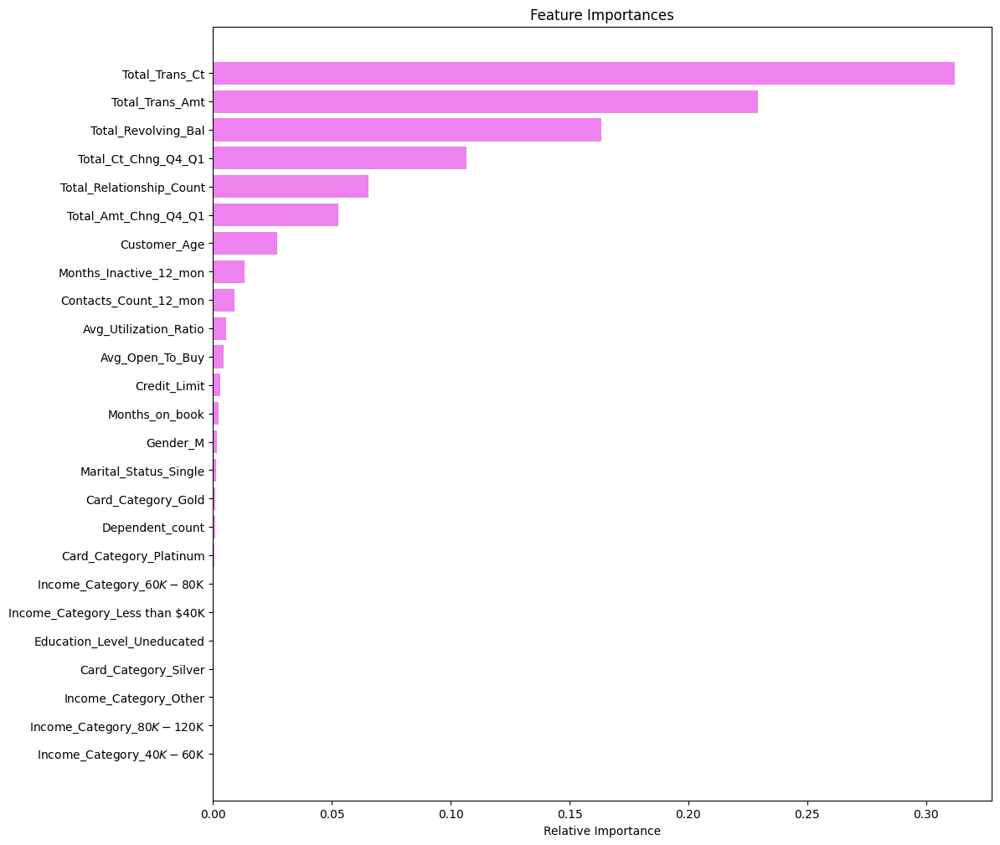

In [ ]:
feature_names = X_test.columns
importances = GradientBoostingClassifier_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## **Observations**

`Total_Trans_Ct`: Is a very good sign of customer engagement and understanding of customer behaviour. If customer transactions decrease 12 mounths they may renounce their credit cards. If total tarnsaction counts decrease this is a oe sign of attriation intend for the customer.

`Total_Trans_Amt`:Like total transaction count its a one good indicator of customer engagement with the bank.If total tarnsaction amount decrease or its pattern changes this is a one sign of attriation intend for the customer.

`Total_Revolving_Bal`:Existing customers revolving pattern shows more high and uniform distributions.Revolvong balance feature is a good source of truth for understannding customer behaviour.

`Total Relationship Count`: Relationship is a good indicator of customer engagement. Pattern of existing customers show more uniform distribution.

`Total_Ct_Chng_Q4_Q1`: Shows uniform pattern in existing customers and more high than attrited customers , this pattern needs to be track regularly.

`Total_Amt_Chng_Q4_Q1`:Shows uniform pattern in existing customers and more high than attrited customers , this pattern needs to be track regularly.


##6-PIPELINE BUILDING

In [ ]:
data_pipeline=data_EDA.copy()

In [ ]:
data_pipeline.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [ ]:
# Numerical Features
numerical_features = [
    "Customer_Age",
    "Dependent_count",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

# creating a transformer for numerical variables, which will apply simple imputer on the numerical variables
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])

# Categorical Features
categorical_features = ["Education_Level","Marital_Status","Gender","Income_Category","Card_Category"]

In [ ]:
# creating a transformer for categorical variables, which will first apply simple imputer and 
#then do one hot encoding for categorical variables
categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)

In [ ]:
# column transformer
imputation_encoding = ColumnTransformer(
    [
        ("imputing_num", SimpleImputer(strategy="median"), numerical_features),
        ("encoding_cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ],
    remainder="passthrough",
)

In [ ]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features),
    ],
    remainder="passthrough",
)

In [ ]:
AttritionFlag={"Existing Customer":0,"Attrited Customer":1}

In [ ]:
data_pipeline['Attrition_Flag']=data_pipeline['Attrition_Flag'].map(AttritionFlag)

In [ ]:
X = data_pipeline.drop(columns="Attrition_Flag")
Y = data_pipeline["Attrition_Flag"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1, stratify=Y
)
print(X_train.shape, X_test.shape)

(7088, 19) (3039, 19)


In [ ]:
GradientBoostingClassifier_tuned=GradientBoostingClassifier(
        n_estimators=150,        
        subsample=0.8,
        max_features=0.8)

**Used the tuned Classifier parameters we got from the 18 different trials**

In [ ]:
# Creating new pipeline with best parameters
model = Pipeline(
    steps=[
        ("pre", preprocessor),
        (
            "GBCTuned",
            GradientBoostingClassifier(
                n_estimators=150,
                subsample=0.8,
                max_features=0.8,
            ),
        ),
    ]
)
# Fit the model on training data
model.fit(X_train, y_train)

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Months_on_book',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_...
                                                   'Total_Trans_Ct',
                                                   'Total_Ct_Chng_Q4_Q1',
                                                   'Avg_Utilization_Ratio']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Education_Level',
                                                   'Marital_Status', 'Gender',
                                                   'Income_Category',
                                                   'Card_Category'])])),
                ('GBCTuned',
                 GradientBoostingClassifier(max_features=0.8, n_estimators=150,
                                            subsample=0.8))])

In [ ]:
model.predict(X_test)

array([0, 1, 0, ..., 0, 0, 0])

In [ ]:
model.score

<bound method Pipeline.score of Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Months_on_book',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Bu

In [ ]:
model.predict_proba

<bound method Pipeline.predict_proba of Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Months_on_book',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Op

In [ ]:
model.score(X_train,y_train)

0.9812358916478555

In [ ]:
model.score(X_test,y_test)

0.9720302731161566